**Weather data obtaining**
We will obtain the needed data for the mode creation

In [1]:
import requests
import requests_cache
import pandas as pd
from urllib3.util.retry import Retry
from requests.adapters import HTTPAdapter

In [9]:
# Setup caching and retry mechanism
cache_session = requests_cache.CachedSession('.cache', expire_after=-1)

# Retry configuration for HTTP requests
retry_strategy = Retry(
    total=5,
    backoff_factor=0.2,
    status_forcelist=[429, 500, 502, 503, 504],
    allowed_methods=["HEAD", "GET", "OPTIONS"]  # Updated this argument
)
adapter = HTTPAdapter(max_retries=retry_strategy)
cache_session.mount("https://", adapter)
cache_session.mount("http://", adapter)

# Define the Open-Meteo API URL and parameters
url = "https://archive-api.open-meteo.com/v1/archive"
params = {
    "latitude": -25.7257,
    "longitude": 27.8483,
    "start_date": "2020-01-01",
    "end_date": "2020-03-31",
    "daily": [
        "temperature_2m_max", "temperature_2m_min", "temperature_2m_mean", 
        "precipitation_sum", "rain_sum", "wind_speed_10m_max", 
        "wind_gusts_10m_max", "wind_direction_10m_dominant", 
        "shortwave_radiation_sum", "surface_pressure_min", 
        "surface_pressure_max", "relative_humidity_2m_min", 
        "relative_humidity_2m_max"
    ],
    "timezone": "auto"
}

# Make the API request
response = cache_session.get(url, params=params)

# Check if the request was successful
if response.status_code == 200:
    # Parse JSON data
    data = response.json()
    daily = data.get("daily", {})
    
    # Prepare the daily data into a DataFrame
    daily_data = {
        "date": pd.to_datetime(daily["time"]),
        "temperature_2m_max": daily.get("temperature_2m_max", []),
        "temperature_2m_min": daily.get("temperature_2m_min", []),
        "temperature_2m_mean": daily.get("temperature_2m_mean", []),
        "precipitation_sum": daily.get("precipitation_sum", []),
        "rain_sum": daily.get("rain_sum", []),
        "wind_speed_10m_max": daily.get("wind_speed_10m_max", []),
        "wind_gusts_10m_max": daily.get("wind_gusts_10m_max", []),
        "wind_direction_10m_dominant": daily.get("wind_direction_10m_dominant", []),
        "shortwave_radiation_sum": daily.get("shortwave_radiation_sum", []),
        "surface_pressure_min": daily.get("surface_pressure_min", []),
        "surface_pressure_max": daily.get("surface_pressure_max", []),
        "relative_humidity_2m_min": daily.get("relative_humidity_2m_min", []),
        "relative_humidity_2m_max": daily.get("relative_humidity_2m_max", [])
    }

    # Convert to DataFrame
    daily_dataframe = pd.DataFrame(data=daily_data)
    
    # Display the DataFrame
    print(daily_dataframe)
    
    # Save the DataFrame to a CSV file for further analysis or model training
    daily_dataframe.to_csv('daily_weather_data_extended.csv', index=False)
else:
    print(f"Error: Unable to retrieve data (Status code: {response.status_code})")


         date  temperature_2m_max  temperature_2m_min  temperature_2m_mean  \
0  2020-01-01                30.0                20.5                 24.6   
1  2020-01-02                31.4                18.5                 24.5   
2  2020-01-03                32.3                19.9                 25.9   
3  2020-01-04                31.5                19.4                 24.8   
4  2020-01-05                30.0                19.2                 24.6   
..        ...                 ...                 ...                  ...   
86 2020-03-27                29.1                15.9                 21.0   
87 2020-03-28                21.8                14.7                 18.1   
88 2020-03-29                25.1                13.2                 18.9   
89 2020-03-30                26.8                16.7                 20.9   
90 2020-03-31                26.5                17.5                 21.2   

    precipitation_sum  rain_sum  wind_speed_10m_max  wind_gusts

**Now Well Add the image data**

In [2]:
import cv2
import numpy as np
import os
import csv
from matplotlib import pyplot as plt

def get_blue_areas_and_percentage(image_path, reference_dam_mask):
    """
    This function calculates the percentage of the blue object within a fixed dam area 
    and returns the mask of blue regions (segmented areas) and their bounding boxes.
    
    Parameters:
    - image_path: str, the path to the image file
    - reference_dam_mask: np.ndarray, a mask of the fixed dam area to be used for comparison
    
    Returns:
    - blue_area_percentage: float, the percentage of the blue area within the fixed dam area
    - blue_mask: np.ndarray, mask representing blue regions within the dam area
    - blue_bounding_boxes: list of bounding boxes for each blue region in the format [(x, y, w, h), ...]
    """
    # Load the image
    image = cv2.imread(image_path)

    # Check if the image was successfully loaded
    if image is None:
        print(f"Error: Image not found or unable to load at path {image_path}")
        return 0.0, None, []

    # Apply the reference dam mask to the original image to isolate the dam region
    dam_region = cv2.bitwise_and(image, image, mask=reference_dam_mask)

    # Convert the isolated dam region to HSV for further processing
    hsv_dam_region = cv2.cvtColor(dam_region, cv2.COLOR_BGR2HSV)

    # Define the range for detecting the blue object within the dam
    lower_blue = np.array([100, 50, 50])
    upper_blue = np.array([140, 255, 255])
    blue_mask = cv2.inRange(hsv_dam_region, lower_blue, upper_blue)

    # Apply the reference mask to only consider the blue areas within the dam
    blue_mask_within_dam = cv2.bitwise_and(blue_mask, blue_mask, mask=reference_dam_mask)

    # Calculate the total blue object area within the dam
    blue_area = np.sum(blue_mask_within_dam > 0)

    # Calculate the percentage of blue object area relative to the reference dam area
    reference_dam_area = np.sum(reference_dam_mask > 0)  # Calculate the reference dam area from the mask
    blue_area_percentage = (blue_area / reference_dam_area) * 100

    # Find contours for the blue areas
    contours, _ = cv2.findContours(blue_mask_within_dam, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a list to store bounding boxes of blue regions
    blue_bounding_boxes = []

    for contour in contours:
        # Get the bounding box for each blue region
        x, y, w, h = cv2.boundingRect(contour)
        blue_bounding_boxes.append([x, y, w, h])

    return blue_area_percentage, blue_mask_within_dam, blue_bounding_boxes

def create_reference_dam_mask(reference_image_path):
    """
    This function creates a fixed reference mask for the dam area from the reference image.
    
    Parameters:
    - reference_image_path: str, the path to the reference image file
    
    Returns:
    - reference_dam_mask: np.ndarray, the mask of the dam area to be used for future calculations
    """
    # Load the reference image
    reference_image = cv2.imread(reference_image_path)

    # Convert the image to HSV (Hue, Saturation, Value) color space
    hsv_image = cv2.cvtColor(reference_image, cv2.COLOR_BGR2HSV)

    # Define the range for detecting the black dam area
    lower_black = np.array([0, 0, 0])
    upper_black = np.array([180, 255, 30])

    # Create a mask for the black area (dam)
    dam_mask = cv2.inRange(hsv_image, lower_black, upper_black)

    # Find contours in the mask (the dam contour)
    contours, _ = cv2.findContours(dam_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        # Get the largest contour, assuming it's the dam
        largest_contour = max(contours, key=cv2.contourArea)

        # Create a mask for the dam region based on the contour
        reference_dam_mask = np.zeros_like(dam_mask)
        cv2.drawContours(reference_dam_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)

        return reference_dam_mask
    else:
        print("No dam detected in the reference image.")
        return None

def process_images_in_folder(folder_path, reference_dam_mask, output_csv_path):
    """
    This function processes all images in a folder and saves the results to a CSV file.
    It also visualizes the blue areas and reference mask.
    
    Parameters:
    - folder_path: str, the path to the folder containing the images
    - reference_dam_mask: np.ndarray, a mask of the fixed dam area to be used for comparison
    - output_csv_path: str, the path to the output CSV file
    """
    # Open the CSV file for writing
    with open(output_csv_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        # Write header row
        writer.writerow(['Image Name', 'Blue Area Percentage', 'Blue Region Bounding Boxes'])

        # Iterate over all images in the folder
        for filename in os.listdir(folder_path):
            if filename.endswith('.jpg') or filename.endswith('.png'):
                image_path = os.path.join(folder_path, filename)
                blue_area_percentage, blue_mask_within_dam, blue_bounding_boxes = get_blue_areas_and_percentage(image_path, reference_dam_mask)

                # Convert bounding boxes to string for CSV output
                blue_bounding_boxes_str = "; ".join([f"[{x}, {y}, {w}, {h}]" for x, y, w, h in blue_bounding_boxes])

                # Save image data to CSV
                writer.writerow([filename, f"{blue_area_percentage:.2f}%", blue_bounding_boxes_str])

                print(f"Processed {filename}, Blue Area: {blue_area_percentage:.2f}%, Blue Regions: {blue_bounding_boxes_str}")

                # Display the results
                if blue_mask_within_dam is not None:
                    plt.figure(figsize=(12, 6))

                    # Original image
                    plt.subplot(1, 3, 1)
                    plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
                    plt.title(f'Original Image: {filename}')

                    # Reference Dam Mask
                    plt.subplot(1, 3, 2)
                    plt.imshow(reference_dam_mask, cmap='gray')
                    plt.title('Reference Dam Mask')

                    # Blue Area Segmentation
                    plt.subplot(1, 3, 3)
                    plt.imshow(blue_mask_within_dam, cmap='Blues')
                    plt.title('Blue Areas within Dam')

                    plt.show()


reference_image_path = 'Reference image\image_2020-05-29.jpg'
reference_dam_mask = create_reference_dam_mask(reference_image_path)

: 

Processed image_2020-01-02.jpg, Blue Area: 7.20%, Blue Regions: [954, 643, 1, 1]; [954, 639, 1, 1]; [951, 630, 3, 7]; [954, 625, 2, 4]; [943, 599, 2, 1]; [943, 597, 1, 1]; [941, 595, 1, 3]; [952, 591, 3, 2]; [976, 580, 1, 1]; [979, 574, 3, 3]; [1000, 562, 1, 1]; [943, 562, 56, 41]; [1002, 561, 3, 3]; [1019, 560, 4, 4]; [1008, 559, 4, 3]; [1016, 554, 1, 1]; [977, 553, 3, 3]; [972, 553, 2, 5]; [1000, 551, 1, 1]; [980, 551, 1, 1]; [974, 551, 1, 1]; [1018, 550, 2, 2]; [1003, 549, 1, 1]; [975, 547, 1, 1]; [980, 546, 4, 4]; [1002, 545, 1, 2]; [1000, 544, 1, 1]; [983, 544, 1, 1]; [1020, 543, 1, 2]; [1022, 539, 1, 1]; [984, 538, 1, 1]; [973, 537, 8, 7]; [985, 536, 12, 15]; [978, 536, 1, 1]; [970, 532, 4, 5]; [969, 532, 1, 1]; [1016, 531, 2, 2]; [968, 528, 2, 2]; [972, 527, 1, 1]; [976, 526, 3, 2]; [980, 525, 3, 3]; [667, 522, 3, 1]; [970, 520, 1, 1]; [969, 518, 1, 1]; [981, 516, 43, 8]; [980, 513, 1, 1]; [968, 512, 1, 3]; [671, 511, 2, 4]; [670, 509, 2, 1]; [667, 509, 2, 1]; [966, 508, 1, 1]; 

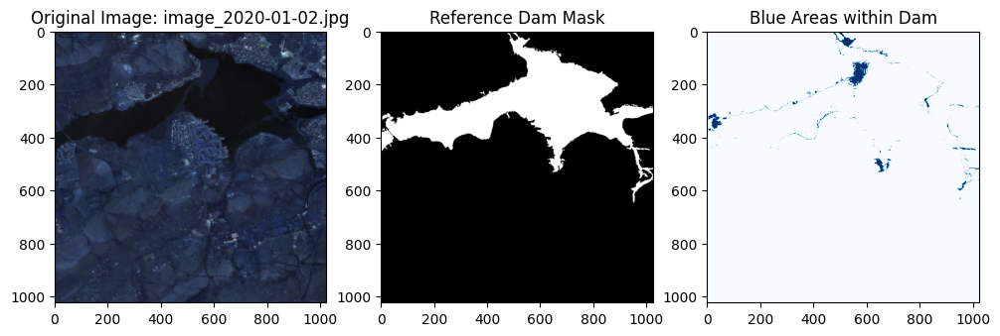

Processed image_2020-01-05.jpg, Blue Area: 5.02%, Blue Regions: [954, 641, 1, 1]; [950, 632, 2, 3]; [955, 627, 1, 1]; [954, 610, 2, 4]; [953, 608, 1, 1]; [958, 605, 1, 2]; [956, 597, 1, 1]; [954, 595, 11, 11]; [974, 588, 5, 3]; [980, 580, 6, 8]; [998, 576, 1, 1]; [989, 574, 2, 4]; [965, 570, 26, 24]; [1013, 568, 1, 1]; [997, 568, 8, 4]; [993, 568, 4, 6]; [1003, 562, 4, 7]; [1014, 557, 9, 10]; [1022, 552, 2, 3]; [1011, 550, 9, 12]; [1021, 548, 1, 1]; [1021, 546, 1, 1]; [1010, 536, 2, 1]; [1008, 536, 1, 1]; [1008, 534, 2, 1]; [1014, 530, 9, 15]; [985, 530, 1, 4]; [976, 527, 2, 1]; [995, 526, 1, 1]; [1009, 524, 2, 2]; [972, 523, 11, 4]; [976, 520, 2, 1]; [1015, 518, 1, 1]; [1022, 517, 1, 1]; [1005, 517, 3, 2]; [968, 512, 4, 9]; [659, 509, 2, 3]; [670, 507, 2, 2]; [964, 505, 5, 5]; [643, 501, 1, 1]; [641, 499, 1, 1]; [643, 498, 1, 1]; [647, 497, 2, 2]; [650, 496, 2, 2]; [639, 495, 5, 2]; [655, 494, 1, 1]; [651, 493, 1, 1]; [647, 492, 2, 2]; [641, 491, 2, 1]; [969, 488, 39, 36]; [979, 487, 

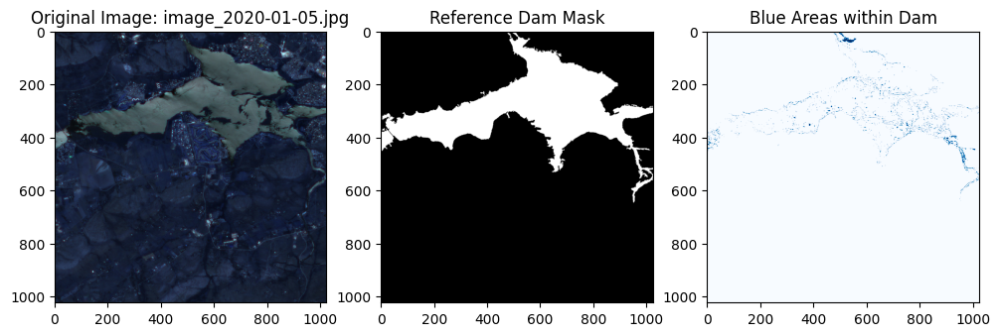

Processed image_2020-01-07.jpg, Blue Area: 3.67%, Blue Regions: [975, 543, 1, 1]; [1009, 537, 1, 1]; [1016, 531, 2, 3]; [974, 522, 11, 6]; [976, 517, 2, 2]; [635, 495, 4, 3]; [651, 488, 2, 3]; [643, 485, 3, 7]; [629, 485, 1, 4]; [637, 481, 2, 2]; [650, 473, 2, 1]; [649, 451, 1, 1]; [649, 449, 1, 1]; [1001, 444, 1, 1]; [643, 438, 5, 5]; [20, 437, 4, 7]; [647, 436, 1, 1]; [631, 436, 1, 1]; [626, 433, 3, 4]; [0, 431, 2, 4]; [37, 430, 4, 4]; [630, 429, 3, 4]; [16, 429, 2, 1]; [18, 428, 8, 5]; [28, 424, 9, 6]; [627, 422, 1, 3]; [43, 420, 1, 1]; [22, 419, 1, 2]; [44, 416, 2, 5]; [40, 416, 3, 4]; [625, 415, 1, 1]; [82, 412, 2, 2]; [635, 411, 2, 1]; [86, 411, 2, 1]; [705, 410, 10, 6]; [95, 410, 2, 2]; [718, 409, 8, 6]; [623, 409, 9, 3]; [99, 408, 1, 1]; [638, 407, 2, 3]; [94, 407, 1, 1]; [60, 405, 17, 10]; [76, 404, 2, 1]; [705, 402, 2, 2]; [100, 402, 6, 4]; [731, 401, 1, 1]; [55, 401, 2, 2]; [114, 400, 1, 1]; [89, 400, 2, 1]; [45, 400, 4, 4]; [113, 398, 1, 1]; [44, 398, 1, 1]; [712, 396, 6, 4

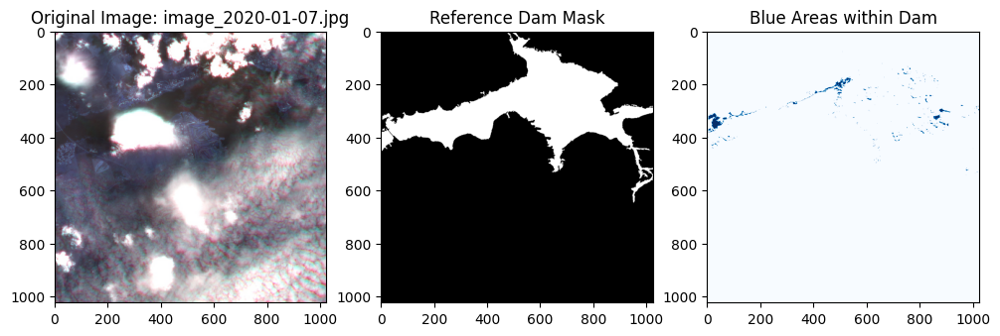

Processed image_2020-01-10.jpg, Blue Area: 0.00%, Blue Regions: 


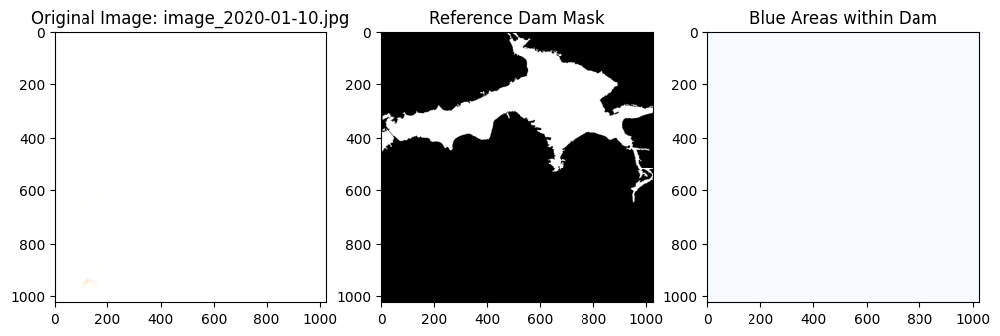

Processed image_2020-01-12.jpg, Blue Area: 9.52%, Blue Regions: [948, 643, 2, 2]; [947, 631, 1, 1]; [948, 627, 1, 2]; [950, 625, 6, 19]; [947, 625, 1, 1]; [945, 618, 3, 4]; [948, 610, 2, 7]; [980, 587, 1, 1]; [1000, 575, 1, 1]; [1002, 573, 2, 2]; [1005, 558, 18, 14]; [941, 550, 79, 56]; [1019, 538, 4, 9]; [1017, 538, 1, 2]; [1013, 536, 3, 3]; [1018, 535, 1, 1]; [1016, 531, 2, 3]; [1003, 528, 9, 11]; [1001, 528, 1, 1]; [972, 527, 1, 1]; [672, 525, 1, 1]; [663, 523, 1, 1]; [667, 522, 2, 1]; [980, 516, 44, 12]; [664, 514, 1, 1]; [977, 509, 4, 5]; [964, 505, 40, 53]; [961, 503, 2, 2]; [971, 501, 5, 10]; [961, 500, 1, 2]; [961, 496, 1, 1]; [958, 496, 2, 3]; [674, 495, 2, 1]; [672, 493, 14, 32]; [676, 489, 2, 3]; [956, 483, 6, 11]; [632, 483, 1, 1]; [676, 482, 17, 9]; [629, 482, 1, 7]; [631, 480, 42, 54]; [968, 479, 1, 1]; [966, 477, 1, 1]; [650, 472, 4, 6]; [649, 465, 2, 1]; [650, 460, 1, 1]; [965, 459, 17, 40]; [965, 456, 1, 1]; [649, 456, 1, 2]; [960, 453, 2, 2]; [651, 452, 4, 8]; [649, 4

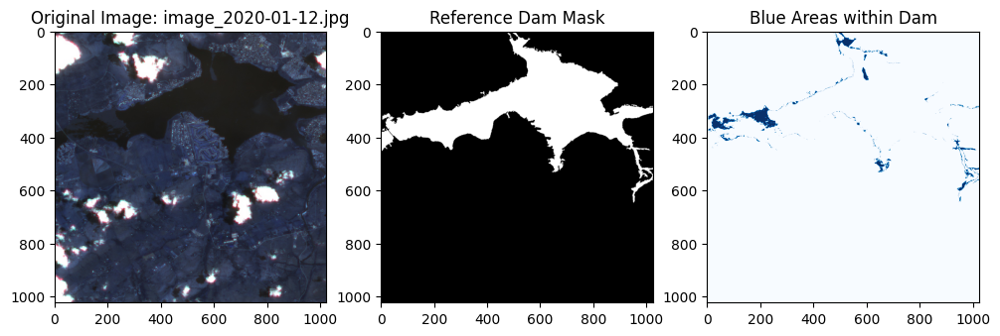

Processed image_2020-01-15.jpg, Blue Area: 23.38%, Blue Regions: [949, 645, 4, 4]; [953, 643, 2, 1]; [954, 641, 1, 1]; [950, 622, 6, 11]; [980, 587, 1, 1]; [974, 586, 5, 4]; [958, 586, 1, 1]; [962, 583, 3, 5]; [959, 580, 1, 1]; [980, 577, 9, 8]; [962, 566, 22, 20]; [977, 555, 1, 1]; [992, 550, 1, 1]; [980, 549, 1, 2]; [986, 542, 1, 2]; [979, 540, 1, 1]; [986, 536, 1, 2]; [971, 533, 1, 1]; [659, 531, 1, 1]; [648, 531, 4, 3]; [643, 530, 2, 2]; [984, 528, 40, 49]; [1010, 527, 1, 1]; [656, 527, 1, 1]; [649, 526, 7, 5]; [1009, 525, 2, 1]; [656, 520, 1, 1]; [1015, 518, 1, 1]; [651, 518, 1, 2]; [1018, 517, 6, 6]; [653, 517, 2, 2]; [974, 516, 34, 24]; [980, 513, 1, 1]; [968, 512, 2, 2]; [644, 500, 7, 4]; [963, 495, 2, 2]; [672, 483, 2, 3]; [629, 482, 1, 1]; [638, 481, 1, 1]; [642, 480, 2, 1]; [672, 479, 2, 1]; [673, 474, 1, 4]; [650, 471, 7, 11]; [655, 468, 2, 2]; [666, 463, 11, 19]; [649, 462, 9, 6]; [666, 458, 1, 2]; [666, 454, 1, 1]; [674, 452, 9, 6]; [665, 452, 1, 1]; [658, 452, 6, 12]; [6

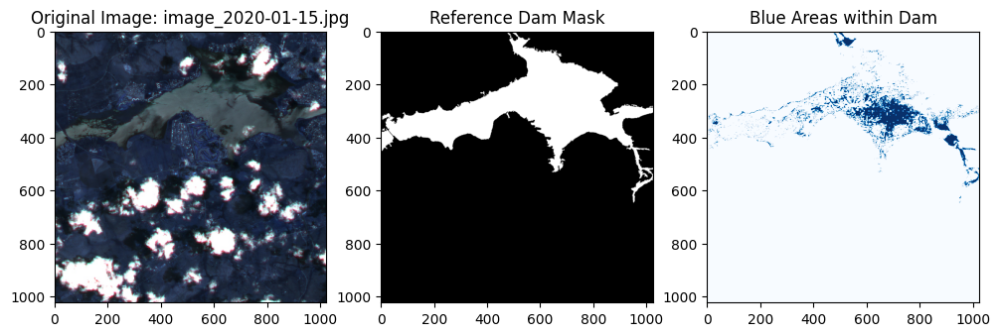

Processed image_2020-01-17.jpg, Blue Area: 4.77%, Blue Regions: [947, 630, 2, 2]; [948, 628, 1, 1]; [950, 625, 6, 12]; [947, 625, 1, 1]; [945, 619, 2, 3]; [948, 615, 1, 1]; [947, 601, 2, 2]; [956, 596, 3, 5]; [983, 584, 1, 1]; [985, 580, 1, 1]; [989, 574, 1, 1]; [966, 566, 15, 22]; [1014, 559, 9, 5]; [978, 547, 3, 5]; [1001, 544, 1, 1]; [989, 541, 2, 1]; [977, 541, 2, 3]; [995, 539, 5, 5]; [658, 530, 2, 2]; [661, 529, 3, 2]; [666, 525, 3, 3]; [663, 523, 1, 1]; [672, 522, 4, 4]; [668, 522, 1, 1]; [674, 521, 2, 1]; [995, 520, 3, 3]; [653, 520, 1, 1]; [990, 517, 2, 2]; [677, 516, 3, 4]; [650, 516, 2, 4]; [643, 515, 19, 19]; [679, 502, 7, 14]; [676, 502, 2, 2]; [670, 501, 2, 4]; [681, 500, 1, 1]; [679, 493, 7, 7]; [676, 489, 2, 3]; [653, 488, 1, 1]; [646, 488, 1, 1]; [631, 487, 35, 27]; [629, 485, 1, 1]; [636, 483, 4, 3]; [635, 483, 1, 1]; [678, 482, 15, 9]; [629, 482, 3, 2]; [638, 481, 1, 1]; [640, 480, 3, 2]; [673, 476, 1, 1]; [650, 472, 4, 2]; [649, 465, 1, 1]; [651, 452, 3, 7]; [649, 4

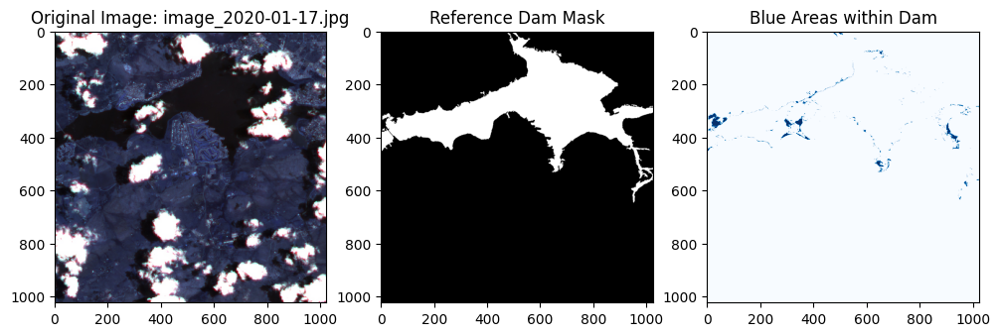

Processed image_2020-01-20.jpg, Blue Area: 5.65%, Blue Regions: [265, 448, 2, 2]; [19, 442, 5, 4]; [12, 438, 4, 5]; [253, 437, 18, 11]; [248, 437, 1, 1]; [20, 437, 4, 6]; [0, 436, 10, 18]; [16, 432, 2, 2]; [7, 432, 8, 3]; [38, 430, 2, 2]; [262, 427, 2, 2]; [24, 427, 1, 1]; [234, 426, 13, 16]; [18, 426, 2, 2]; [267, 425, 5, 9]; [28, 425, 4, 3]; [261, 422, 1, 4]; [30, 422, 2, 2]; [28, 422, 1, 1]; [272, 421, 1, 1]; [36, 421, 1, 2]; [237, 420, 1, 1]; [234, 420, 4, 4]; [33, 420, 2, 4]; [273, 419, 1, 1]; [264, 419, 1, 2]; [32, 419, 1, 1]; [273, 417, 1, 1]; [228, 416, 5, 8]; [217, 415, 4, 3]; [207, 414, 3, 2]; [34, 414, 12, 7]; [206, 413, 1, 1]; [275, 411, 1, 1]; [268, 410, 2, 1]; [94, 410, 3, 2]; [89, 410, 4, 2]; [85, 410, 3, 2]; [42, 410, 2, 1]; [32, 410, 4, 2]; [275, 409, 1, 1]; [187, 409, 11, 9]; [45, 409, 1, 1]; [277, 407, 1, 1]; [70, 406, 1, 1]; [88, 405, 2, 1]; [65, 405, 19, 9]; [96, 404, 6, 6]; [91, 403, 4, 3]; [80, 403, 2, 2]; [73, 403, 1, 1]; [177, 402, 14, 6]; [103, 401, 13, 5]; [4

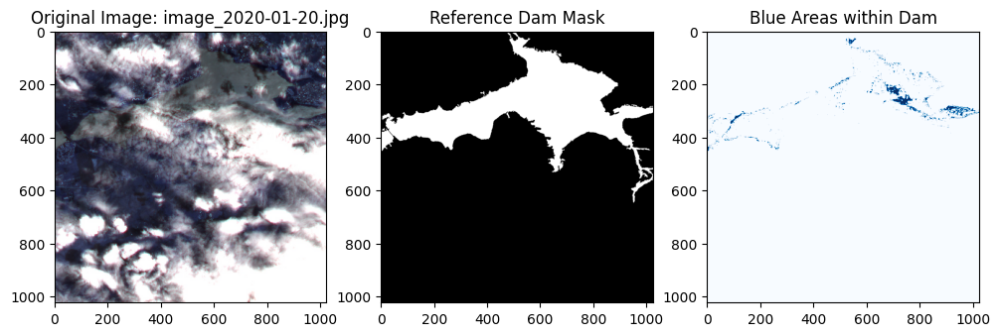

Processed image_2020-01-22.jpg, Blue Area: 0.89%, Blue Regions: [981, 488, 1, 1]; [979, 487, 1, 1]; [959, 485, 1, 1]; [972, 480, 2, 2]; [956, 476, 2, 4]; [957, 474, 1, 1]; [970, 469, 3, 3]; [924, 439, 22, 9]; [928, 434, 1, 2]; [930, 433, 1, 1]; [222, 416, 1, 2]; [949, 414, 3, 2]; [220, 411, 10, 4]; [188, 411, 31, 7]; [867, 409, 1, 1]; [942, 408, 2, 3]; [869, 408, 2, 1]; [858, 408, 7, 2]; [872, 407, 1, 1]; [396, 407, 3, 2]; [268, 404, 1, 1]; [940, 403, 1, 1]; [170, 402, 5, 1]; [161, 402, 2, 1]; [159, 401, 1, 1]; [156, 401, 2, 1]; [144, 401, 1, 1]; [154, 400, 1, 1]; [144, 398, 6, 2]; [935, 395, 10, 6]; [929, 393, 5, 4]; [304, 393, 1, 1]; [124, 393, 2, 3]; [927, 392, 1, 1]; [61, 392, 1, 1]; [921, 388, 5, 4]; [298, 385, 3, 6]; [916, 379, 2, 2]; [912, 379, 1, 2]; [595, 374, 1, 1]; [592, 374, 2, 1]; [913, 373, 1, 1]; [601, 373, 1, 1]; [589, 373, 1, 1]; [911, 369, 1, 3]; [11, 369, 3, 1]; [28, 361, 2, 1]; [904, 347, 6, 16]; [909, 344, 1, 1]; [62, 336, 2, 1]; [7, 336, 1, 1]; [912, 333, 3, 5]; [

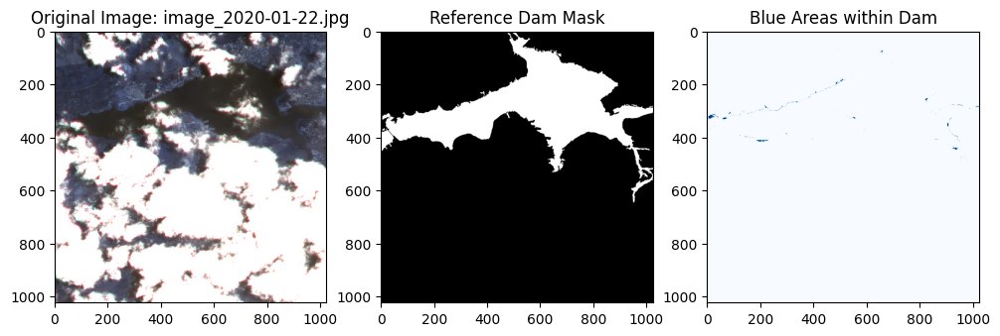

Processed image_2020-01-25.jpg, Blue Area: 0.01%, Blue Regions: [286, 339, 6, 4]; [146, 310, 3, 2]; [142, 309, 2, 1]


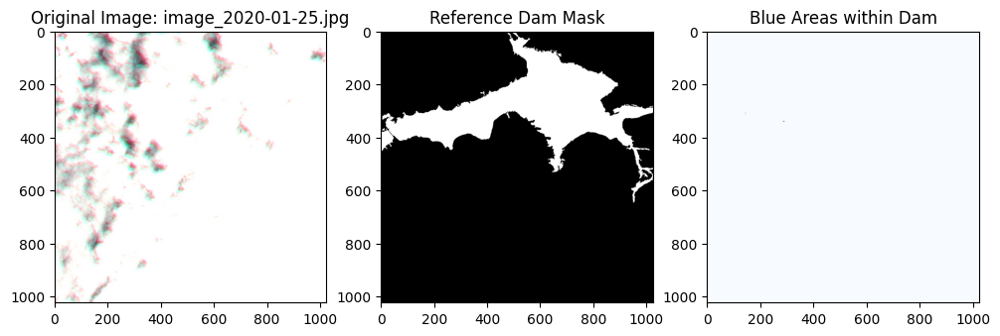

Processed image_2020-01-27.jpg, Blue Area: 4.82%, Blue Regions: [958, 597, 1, 1]; [955, 597, 1, 1]; [946, 593, 1, 1]; [963, 592, 1, 1]; [948, 592, 2, 1]; [964, 587, 2, 4]; [959, 584, 1, 1]; [960, 576, 1, 1]; [962, 574, 3, 3]; [967, 573, 4, 3]; [979, 571, 3, 2]; [968, 571, 1, 1]; [990, 567, 1, 1]; [987, 567, 2, 2]; [971, 567, 2, 1]; [991, 565, 1, 1]; [996, 564, 1, 1]; [1019, 559, 4, 5]; [1011, 559, 1, 1]; [972, 553, 1, 1]; [1018, 551, 1, 1]; [992, 550, 1, 1]; [1020, 543, 1, 2]; [1022, 539, 1, 1]; [980, 539, 1, 1]; [986, 536, 2, 2]; [981, 535, 5, 5]; [972, 535, 1, 1]; [971, 533, 1, 1]; [650, 533, 1, 1]; [654, 531, 1, 2]; [643, 531, 1, 1]; [985, 530, 1, 1]; [979, 529, 5, 3]; [654, 529, 1, 1]; [982, 526, 1, 1]; [975, 526, 5, 3]; [1021, 522, 1, 1]; [660, 522, 1, 1]; [1010, 521, 2, 1]; [969, 518, 1, 1]; [655, 518, 1, 1]; [651, 518, 1, 1]; [1013, 517, 10, 7]; [1004, 516, 8, 4]; [998, 516, 5, 2]; [984, 516, 13, 4]; [672, 516, 3, 10]; [980, 513, 1, 1]; [968, 512, 1, 3]; [648, 510, 1, 2]; [682, 

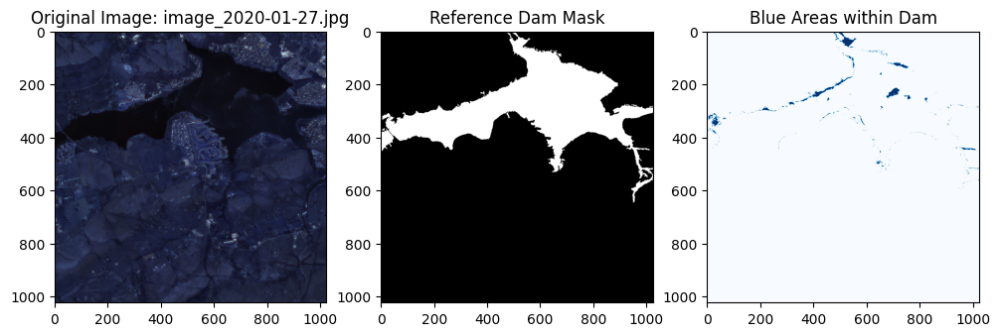

Processed image_2020-01-30.jpg, Blue Area: 78.28%, Blue Regions: [947, 622, 9, 27]; [952, 619, 2, 2]; [950, 619, 1, 2]; [950, 613, 3, 4]; [952, 610, 1, 1]; [956, 608, 1, 1]; [954, 608, 1, 1]; [965, 598, 2, 2]; [946, 598, 1, 1]; [945, 592, 21, 14]; [953, 591, 1, 1]; [958, 590, 2, 2]; [961, 587, 5, 7]; [959, 584, 2, 2]; [961, 582, 1, 1]; [966, 579, 1, 2]; [971, 570, 1, 2]; [963, 569, 7, 9]; [971, 567, 1, 1]; [973, 566, 4, 8]; [994, 563, 4, 2]; [967, 553, 56, 43]; [979, 550, 2, 3]; [1020, 547, 4, 8]; [982, 545, 2, 3]; [1001, 544, 3, 8]; [996, 544, 1, 2]; [983, 543, 1, 1]; [991, 542, 1, 1]; [986, 542, 1, 2]; [989, 541, 1, 1]; [986, 536, 1, 2]; [656, 532, 1, 1]; [969, 531, 1, 2]; [659, 531, 1, 1]; [648, 531, 4, 3]; [656, 530, 1, 1]; [979, 529, 7, 11]; [652, 528, 2, 2]; [656, 526, 1, 1]; [672, 525, 1, 1]; [675, 524, 1, 1]; [675, 521, 1, 1]; [672, 518, 1, 5]; [1009, 517, 15, 6]; [1004, 516, 5, 4]; [973, 516, 50, 30]; [683, 513, 2, 2]; [976, 509, 5, 8]; [685, 509, 1, 1]; [652, 508, 2, 1]; [644

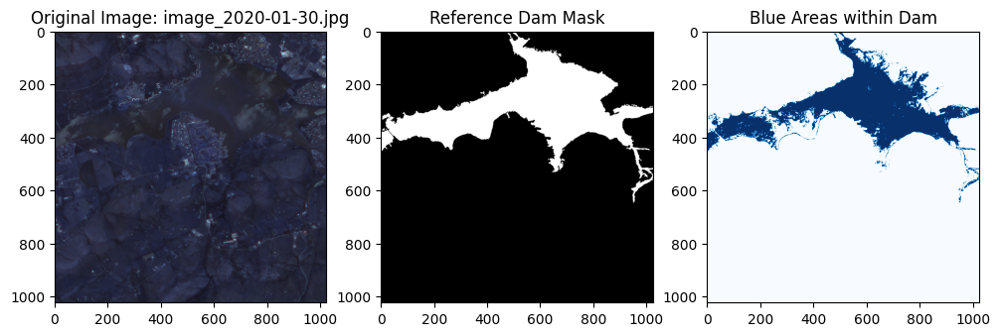

Processed image_2020-02-01.jpg, Blue Area: 34.04%, Blue Regions: [949, 602, 1, 1]; [948, 600, 1, 1]; [946, 592, 4, 2]; [955, 589, 1, 1]; [962, 588, 4, 6]; [962, 576, 1, 1]; [963, 574, 3, 3]; [964, 572, 1, 1]; [979, 571, 2, 2]; [967, 569, 6, 6]; [990, 567, 1, 1]; [987, 567, 2, 2]; [971, 567, 1, 1]; [991, 565, 1, 1]; [1020, 562, 3, 2]; [993, 562, 4, 4]; [1010, 559, 2, 2]; [1021, 558, 2, 3]; [973, 557, 1, 1]; [972, 553, 1, 2]; [1018, 550, 2, 2]; [1003, 549, 1, 1]; [992, 546, 1, 1]; [1020, 543, 1, 2]; [986, 542, 1, 2]; [978, 540, 2, 1]; [986, 536, 2, 2]; [972, 535, 1, 1]; [981, 533, 5, 7]; [971, 533, 1, 1]; [656, 532, 1, 1]; [648, 532, 1, 2]; [643, 530, 2, 3]; [980, 529, 4, 3]; [651, 527, 1, 1]; [975, 526, 2, 2]; [658, 526, 1, 1]; [980, 525, 3, 3]; [672, 525, 2, 1]; [652, 523, 1, 2]; [660, 522, 1, 1]; [657, 520, 1, 1]; [655, 518, 1, 1]; [651, 518, 1, 1]; [984, 517, 3, 2]; [672, 517, 3, 7]; [987, 516, 36, 8]; [968, 512, 1, 2]; [979, 511, 2, 3]; [648, 511, 2, 3]; [685, 509, 1, 1]; [682, 509,

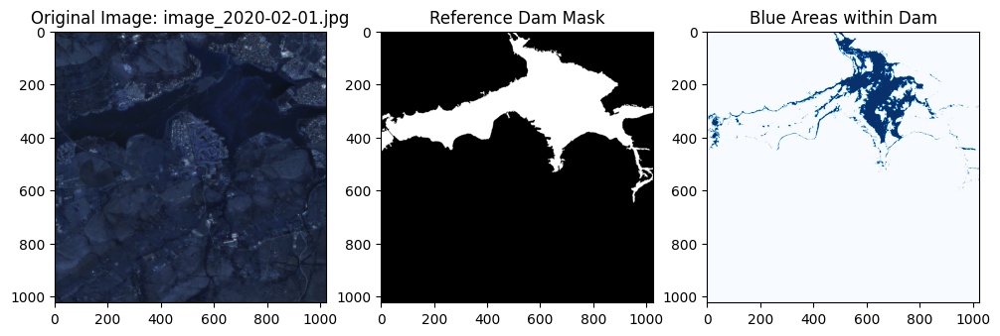

Processed image_2020-02-04.jpg, Blue Area: 38.53%, Blue Regions: [954, 643, 1, 1]; [954, 641, 1, 1]; [951, 631, 2, 3]; [955, 625, 1, 4]; [968, 591, 2, 3]; [978, 587, 3, 2]; [970, 584, 6, 6]; [976, 582, 1, 1]; [983, 579, 2, 6]; [980, 577, 2, 2]; [987, 574, 1, 2]; [986, 536, 1, 1]; [981, 530, 5, 9]; [976, 527, 2, 1]; [982, 526, 1, 1]; [994, 520, 1, 1]; [997, 518, 5, 6]; [1006, 517, 1, 1]; [990, 517, 3, 3]; [985, 517, 1, 1]; [1002, 516, 1, 1]; [998, 516, 3, 1]; [987, 516, 2, 1]; [664, 510, 2, 1]; [661, 497, 1, 1]; [647, 497, 2, 2]; [650, 496, 2, 1]; [673, 495, 1, 2]; [639, 495, 7, 4]; [655, 494, 1, 1]; [647, 492, 1, 2]; [641, 490, 2, 2]; [981, 488, 1, 1]; [972, 480, 4, 4]; [653, 472, 1, 1]; [968, 467, 3, 3]; [672, 467, 6, 11]; [649, 465, 1, 1]; [678, 462, 3, 4]; [681, 460, 1, 1]; [682, 457, 1, 1]; [964, 455, 2, 3]; [649, 452, 5, 8]; [962, 450, 2, 3]; [649, 449, 1, 1]; [6, 449, 2, 3]; [984, 447, 1, 2]; [980, 447, 2, 1]; [968, 447, 1, 1]; [259, 447, 1, 1]; [269, 446, 1, 1]; [8, 446, 2, 2]; 

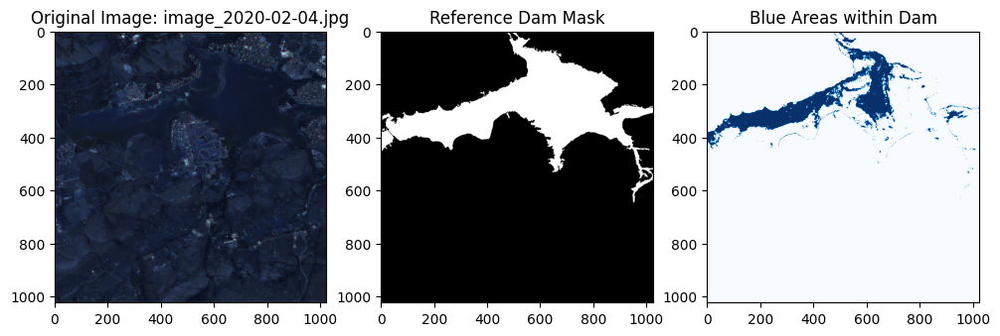

Processed image_2020-02-06.jpg, Blue Area: 38.19%, Blue Regions: [993, 569, 4, 2]; [987, 568, 1, 1]; [991, 567, 1, 2]; [1008, 563, 8, 6]; [1020, 553, 4, 3]; [1016, 553, 2, 3]; [999, 549, 5, 3]; [986, 543, 1, 1]; [980, 543, 4, 4]; [979, 539, 1, 2]; [996, 523, 9, 3]; [996, 520, 1, 2]; [992, 519, 1, 1]; [1006, 518, 11, 6]; [980, 516, 3, 2]; [979, 512, 2, 2]; [658, 504, 6, 6]; [653, 498, 1, 2]; [962, 486, 3, 3]; [960, 478, 1, 1]; [957, 474, 2, 2]; [988, 443, 2, 3]; [984, 443, 2, 1]; [20, 439, 4, 5]; [941, 422, 3, 2]; [8, 415, 27, 10]; [905, 410, 6, 2]; [898, 410, 4, 2]; [917, 409, 3, 3]; [90, 408, 3, 2]; [92, 405, 8, 5]; [726, 401, 5, 2]; [735, 400, 3, 2]; [107, 400, 1, 2]; [726, 399, 1, 1]; [357, 396, 2, 2]; [900, 394, 6, 10]; [888, 394, 3, 1]; [876, 394, 4, 3]; [51, 394, 1, 2]; [917, 393, 28, 15]; [908, 393, 6, 8]; [916, 392, 1, 1]; [725, 392, 1, 2]; [44, 392, 2, 2]; [251, 391, 1, 1]; [347, 390, 1, 1]; [254, 390, 1, 1]; [42, 390, 1, 1]; [878, 388, 3, 2]; [763, 388, 1, 1]; [761, 387, 1, 1

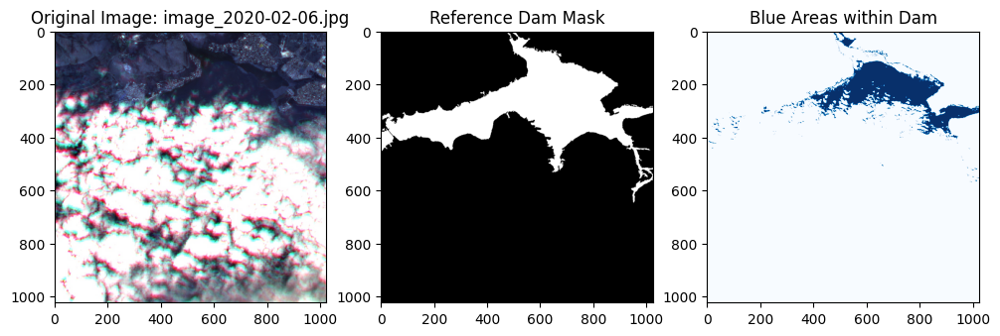

Processed image_2020-02-09.jpg, Blue Area: 7.58%, Blue Regions: [948, 639, 7, 7]; [947, 627, 8, 8]; [954, 601, 1, 1]; [954, 594, 3, 2]; [941, 593, 5, 6]; [948, 592, 2, 3]; [953, 566, 51, 33]; [974, 566, 3, 2]; [991, 565, 1, 1]; [1001, 564, 5, 3]; [993, 562, 2, 1]; [972, 553, 5, 5]; [1008, 540, 16, 29]; [996, 539, 8, 13]; [990, 537, 1, 1]; [1006, 536, 2, 1]; [653, 528, 1, 2]; [968, 527, 8, 11]; [656, 527, 1, 1]; [961, 501, 1, 1]; [958, 498, 1, 1]; [958, 496, 1, 1]; [981, 488, 1, 1]; [978, 487, 2, 1]; [964, 460, 3, 3]; [952, 454, 46, 101]; [959, 453, 4, 3]; [953, 449, 2, 2]; [927, 445, 1, 1]; [1000, 444, 13, 7]; [932, 444, 6, 4]; [986, 443, 10, 5]; [224, 419, 1, 1]; [714, 417, 1, 1]; [197, 417, 1, 1]; [207, 415, 9, 2]; [202, 414, 3, 3]; [209, 413, 1, 1]; [245, 412, 4, 2]; [216, 411, 7, 7]; [725, 410, 1, 2]; [273, 410, 5, 6]; [913, 409, 1, 1]; [858, 408, 3, 2]; [241, 408, 2, 1]; [207, 408, 7, 4]; [889, 405, 4, 7]; [196, 405, 1, 1]; [396, 404, 2, 2]; [936, 402, 1, 1]; [382, 401, 1, 2]; [36

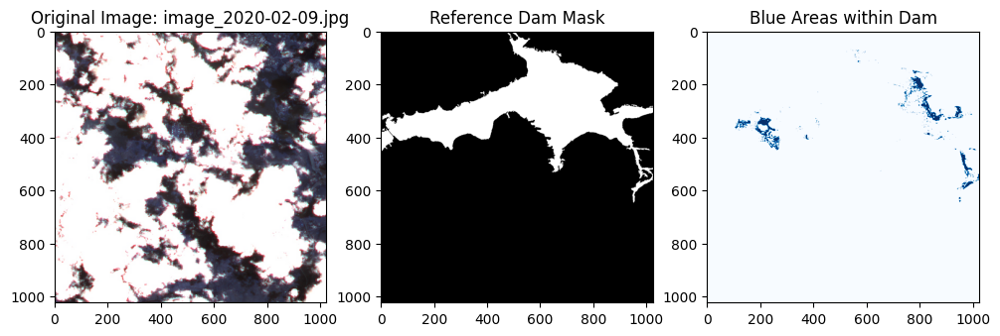

Processed image_2020-02-11.jpg, Blue Area: 20.59%, Blue Regions: [945, 612, 11, 29]; [949, 610, 1, 1]; [963, 597, 1, 1]; [941, 589, 20, 19]; [961, 588, 5, 7]; [973, 582, 3, 3]; [994, 576, 2, 2]; [980, 576, 1, 1]; [1003, 573, 1, 2]; [986, 572, 4, 5]; [980, 571, 1, 1]; [971, 566, 6, 6]; [1000, 562, 1, 1]; [985, 562, 14, 8]; [1017, 559, 6, 5]; [1003, 554, 15, 18]; [979, 554, 1, 1]; [972, 553, 1, 1]; [1022, 550, 2, 2]; [1018, 550, 5, 8]; [992, 550, 1, 1]; [994, 547, 10, 5]; [1001, 544, 1, 1]; [975, 543, 1, 1]; [985, 541, 2, 3]; [1016, 538, 8, 9]; [977, 538, 4, 3]; [973, 538, 3, 4]; [986, 536, 2, 2]; [1005, 535, 6, 3]; [1008, 534, 2, 1]; [971, 533, 3, 4]; [980, 529, 6, 13]; [968, 528, 2, 3]; [1001, 527, 2, 2]; [984, 523, 1, 1]; [1005, 517, 19, 7]; [998, 516, 5, 1]; [968, 511, 15, 18]; [966, 507, 2, 3]; [958, 496, 1, 1]; [959, 493, 1, 1]; [959, 468, 1, 1]; [6, 451, 1, 1]; [945, 445, 1, 1]; [974, 443, 39, 7]; [0, 443, 10, 7]; [952, 442, 4, 4]; [947, 442, 48, 79]; [19, 441, 5, 5]; [16, 439, 3,

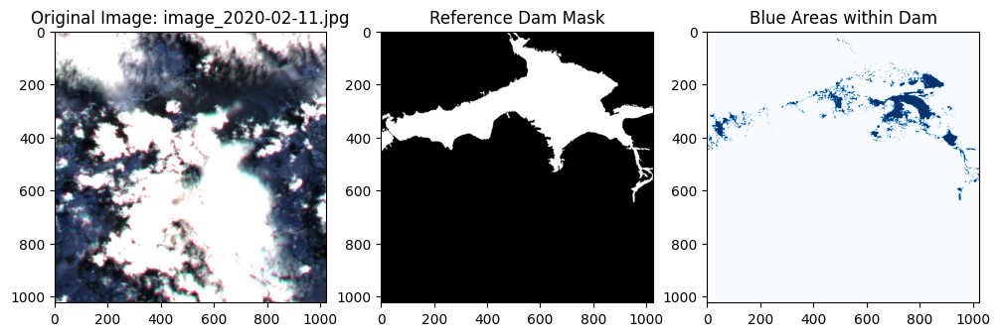

Processed image_2020-02-14.jpg, Blue Area: 5.21%, Blue Regions: [954, 641, 1, 1]; [949, 619, 7, 18]; [953, 617, 1, 1]; [960, 600, 6, 6]; [966, 597, 2, 2]; [968, 592, 5, 4]; [982, 577, 5, 3]; [998, 571, 6, 6]; [1013, 568, 1, 1]; [1005, 567, 7, 5]; [1010, 559, 2, 2]; [1019, 558, 4, 6]; [1016, 554, 1, 1]; [1018, 550, 2, 3]; [1003, 549, 1, 1]; [1001, 544, 2, 4]; [1023, 542, 1, 1]; [1020, 538, 1, 1]; [986, 536, 1, 1]; [1005, 535, 6, 4]; [1015, 531, 4, 6]; [983, 530, 3, 7]; [983, 530, 1, 1]; [981, 529, 1, 1]; [995, 526, 1, 1]; [976, 524, 7, 4]; [997, 519, 1, 1]; [986, 518, 1, 1]; [1005, 517, 3, 2]; [984, 517, 1, 1]; [1000, 516, 2, 1]; [992, 516, 3, 3]; [989, 516, 1, 1]; [987, 516, 1, 1]; [976, 511, 3, 2]; [659, 506, 7, 6]; [660, 498, 2, 2]; [647, 497, 2, 2]; [657, 496, 1, 1]; [640, 495, 6, 4]; [646, 492, 2, 2]; [969, 491, 8, 20]; [650, 490, 1, 1]; [641, 490, 2, 2]; [981, 488, 1, 1]; [654, 488, 7, 7]; [977, 486, 3, 2]; [968, 476, 8, 12]; [673, 473, 1, 1]; [650, 473, 2, 1]; [653, 472, 1, 1]; [

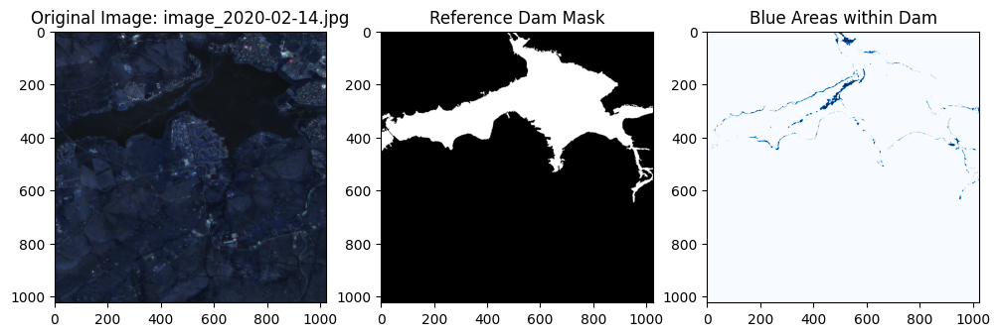

Processed image_2020-02-16.jpg, Blue Area: 4.60%, Blue Regions: [948, 642, 2, 5]; [953, 640, 2, 4]; [947, 631, 1, 1]; [950, 620, 6, 18]; [948, 610, 2, 7]; [945, 601, 1, 1]; [959, 599, 7, 8]; [971, 591, 3, 3]; [957, 588, 4, 4]; [943, 586, 26, 20]; [969, 581, 16, 8]; [960, 581, 1, 1]; [993, 566, 1, 2]; [975, 566, 1, 1]; [1018, 556, 1, 1]; [975, 550, 48, 32]; [992, 548, 4, 3]; [1020, 542, 4, 3]; [994, 540, 10, 12]; [1020, 538, 3, 3]; [658, 531, 1, 1]; [661, 530, 1, 1]; [654, 529, 3, 4]; [643, 529, 9, 5]; [668, 527, 1, 1]; [672, 524, 4, 2]; [649, 523, 4, 7]; [654, 522, 1, 1]; [653, 520, 1, 1]; [677, 518, 2, 2]; [672, 516, 1, 1]; [650, 516, 13, 12]; [663, 514, 2, 1]; [666, 513, 1, 1]; [658, 507, 8, 6]; [646, 506, 10, 8]; [643, 506, 2, 2]; [640, 504, 1, 1]; [680, 502, 6, 14]; [654, 502, 1, 1]; [669, 501, 3, 4]; [961, 500, 1, 2]; [681, 500, 1, 1]; [632, 497, 1, 1]; [679, 495, 7, 5]; [681, 493, 3, 2]; [672, 493, 5, 7]; [681, 489, 1, 1]; [676, 489, 2, 2]; [632, 487, 30, 19]; [650, 487, 1, 1]; [

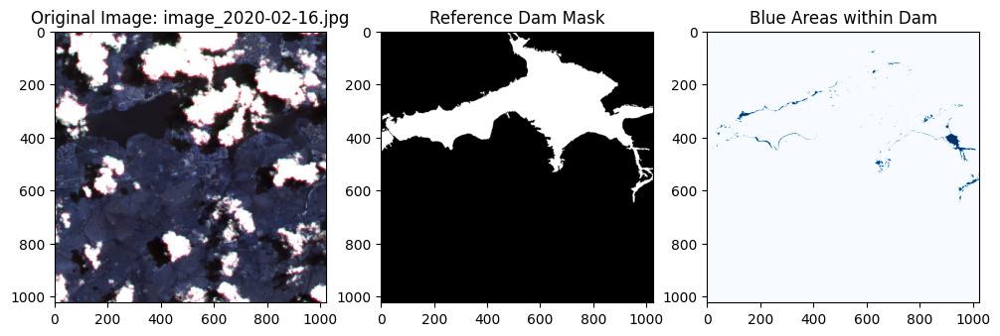

Processed image_2020-02-19.jpg, Blue Area: 26.85%, Blue Regions: [951, 647, 1, 1]; [947, 629, 8, 15]; [946, 608, 10, 19]; [950, 605, 1, 1]; [992, 575, 5, 3]; [1016, 554, 1, 1]; [944, 550, 80, 58]; [1018, 550, 2, 4]; [1022, 547, 1, 1]; [992, 546, 1, 5]; [1017, 538, 6, 7]; [650, 533, 1, 1]; [968, 530, 2, 3]; [643, 529, 5, 4]; [672, 524, 3, 2]; [983, 519, 1, 1]; [981, 517, 1, 1]; [984, 516, 40, 23]; [987, 516, 2, 1]; [672, 514, 9, 8]; [684, 513, 1, 1]; [979, 512, 2, 2]; [969, 510, 35, 48]; [979, 509, 1, 1]; [670, 509, 1, 1]; [966, 508, 1, 1]; [961, 498, 7, 9]; [678, 497, 2, 1]; [969, 496, 7, 15]; [676, 495, 1, 1]; [670, 494, 3, 3]; [680, 493, 6, 8]; [958, 489, 13, 10]; [673, 488, 5, 6]; [978, 487, 4, 3]; [641, 486, 1, 1]; [676, 484, 1, 1]; [662, 484, 8, 5]; [679, 483, 13, 7]; [635, 482, 6, 5]; [642, 481, 5, 7]; [663, 479, 1, 1]; [966, 475, 10, 9]; [634, 475, 52, 58]; [658, 474, 2, 2]; [650, 472, 4, 2]; [956, 471, 8, 19]; [968, 466, 5, 7]; [649, 465, 3, 3]; [958, 462, 1, 1]; [953, 462, 4, 

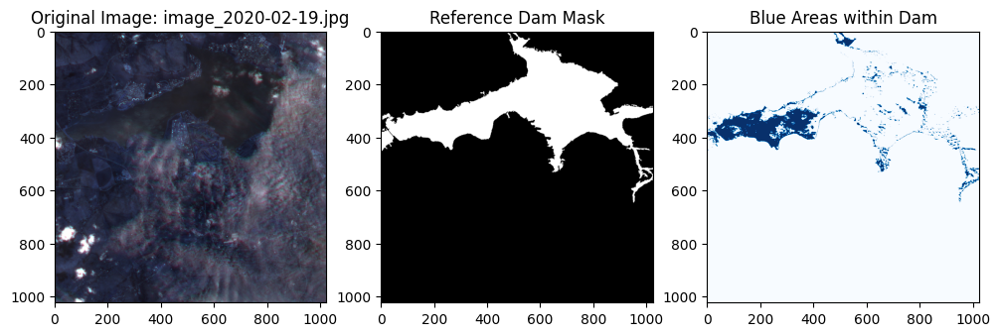

Processed image_2020-02-21.jpg, Blue Area: 17.85%, Blue Regions: [949, 646, 1, 1]; [954, 643, 1, 1]; [948, 643, 1, 1]; [951, 620, 5, 15]; [961, 600, 5, 6]; [971, 592, 2, 2]; [984, 578, 3, 2]; [964, 575, 1, 1]; [980, 571, 1, 1]; [987, 568, 1, 1]; [990, 567, 1, 1]; [998, 566, 16, 11]; [995, 563, 2, 2]; [1004, 562, 1, 1]; [1008, 559, 4, 3]; [1019, 558, 4, 6]; [972, 553, 1, 1]; [1014, 550, 6, 8]; [1002, 549, 2, 2]; [1002, 545, 1, 1]; [1020, 544, 1, 1]; [1018, 535, 1, 1]; [1005, 535, 7, 4]; [1007, 533, 1, 1]; [971, 533, 1, 1]; [1016, 531, 2, 3]; [985, 530, 1, 1]; [995, 526, 3, 1]; [672, 525, 1, 1]; [976, 524, 7, 4]; [971, 522, 1, 1]; [1015, 518, 1, 1]; [1012, 518, 2, 1]; [969, 518, 1, 1]; [1006, 517, 1, 2]; [984, 517, 3, 2]; [1000, 516, 1, 1]; [998, 516, 1, 1]; [987, 516, 8, 4]; [672, 514, 2, 10]; [980, 513, 1, 1]; [968, 512, 1, 2]; [659, 507, 3, 5]; [670, 503, 1, 1]; [635, 500, 1, 1]; [641, 499, 1, 3]; [970, 497, 10, 17]; [958, 496, 1, 1]; [673, 494, 2, 3]; [650, 492, 3, 2]; [654, 491, 8, 

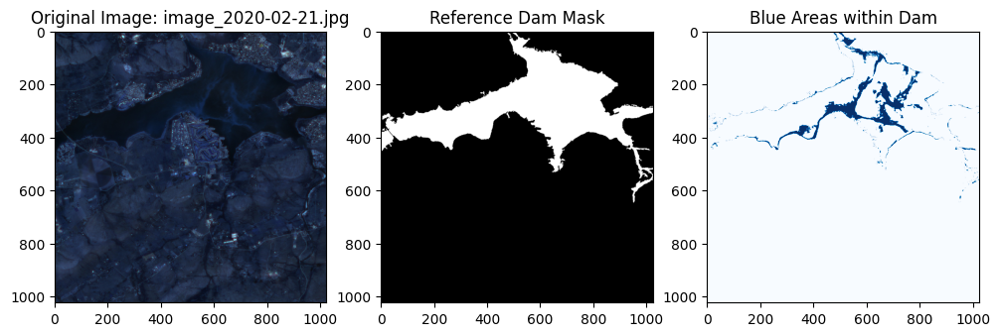

Processed image_2020-02-24.jpg, Blue Area: 55.73%, Blue Regions: [947, 590, 29, 59]; [976, 588, 1, 1]; [978, 584, 5, 5]; [982, 575, 8, 10]; [975, 568, 1, 3]; [992, 566, 22, 12]; [1019, 561, 4, 3]; [1005, 559, 7, 4]; [1020, 558, 3, 2]; [1013, 550, 9, 9]; [1022, 548, 1, 1]; [1002, 545, 1, 1]; [1023, 542, 1, 1]; [1020, 542, 1, 3]; [1018, 539, 1, 1]; [1020, 538, 3, 2]; [1005, 535, 6, 4]; [656, 532, 1, 1]; [648, 532, 4, 2]; [643, 531, 2, 2]; [1014, 530, 5, 7]; [985, 530, 1, 1]; [653, 528, 1, 3]; [650, 528, 1, 3]; [995, 526, 1, 1]; [651, 526, 1, 1]; [672, 525, 1, 1]; [976, 524, 7, 3]; [672, 522, 1, 1]; [659, 522, 1, 1]; [1017, 518, 2, 2]; [1015, 518, 1, 2]; [1022, 517, 1, 1]; [984, 517, 5, 3]; [1004, 516, 4, 3]; [999, 516, 3, 1]; [990, 516, 5, 4]; [987, 516, 3, 1]; [980, 513, 1, 1]; [979, 511, 1, 1]; [652, 508, 2, 2]; [670, 503, 1, 1]; [632, 497, 1, 1]; [969, 490, 9, 24]; [969, 487, 1, 1]; [977, 486, 5, 5]; [674, 483, 1, 2]; [648, 482, 1, 1]; [629, 482, 1, 1]; [645, 481, 1, 1]; [638, 481, 1,

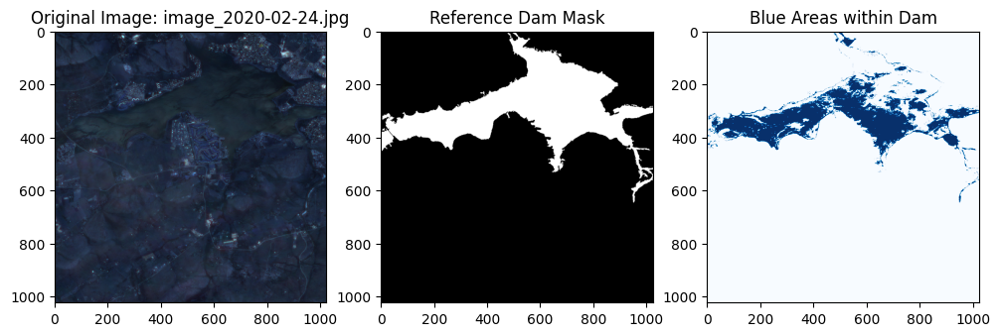

Processed image_2020-02-26.jpg, Blue Area: 46.77%, Blue Regions: [948, 643, 3, 5]; [954, 641, 1, 1]; [954, 639, 1, 1]; [950, 620, 6, 15]; [961, 599, 5, 7]; [967, 597, 1, 1]; [971, 592, 2, 2]; [962, 592, 2, 2]; [964, 589, 1, 2]; [984, 577, 5, 3]; [968, 573, 1, 1]; [980, 571, 1, 1]; [990, 567, 1, 1]; [987, 567, 2, 2]; [996, 566, 16, 11]; [994, 565, 1, 1]; [996, 564, 1, 1]; [1019, 562, 4, 2]; [1003, 562, 2, 2]; [1008, 559, 4, 3]; [1022, 558, 1, 2]; [1013, 550, 7, 9]; [1003, 549, 1, 1]; [1020, 544, 1, 1]; [1023, 542, 1, 1]; [1020, 538, 3, 2]; [1005, 535, 7, 4]; [971, 533, 1, 1]; [1015, 531, 4, 5]; [1003, 530, 1, 1]; [995, 526, 1, 1]; [672, 525, 1, 1]; [977, 524, 6, 4]; [1013, 518, 4, 3]; [969, 518, 1, 1]; [1022, 517, 2, 2]; [1018, 517, 2, 2]; [1005, 517, 3, 2]; [672, 517, 2, 7]; [998, 516, 6, 1]; [984, 516, 12, 4]; [982, 516, 1, 1]; [968, 512, 1, 1]; [682, 510, 1, 1]; [659, 507, 6, 6]; [685, 503, 1, 1]; [669, 502, 3, 3]; [634, 500, 2, 1]; [641, 499, 3, 3]; [970, 496, 11, 18]; [958, 496, 1,

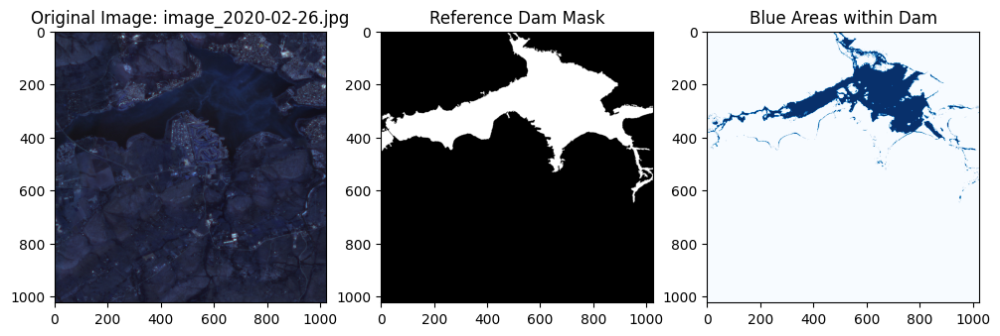

Processed image_2020-02-29.jpg, Blue Area: 0.00%, Blue Regions: 


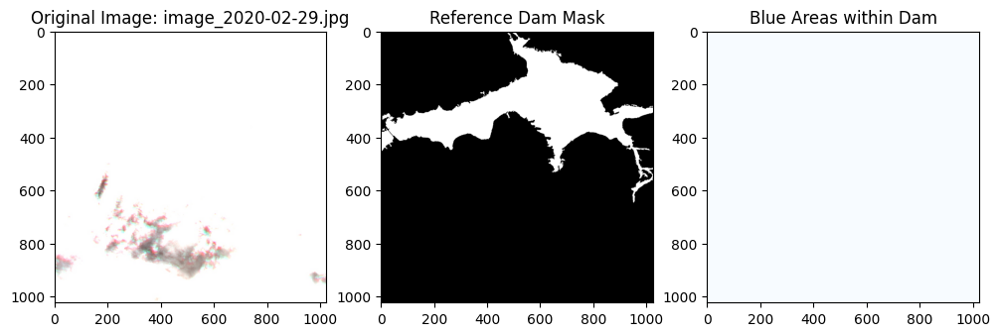

Processed image_2020-03-02.jpg, Blue Area: 0.00%, Blue Regions: 


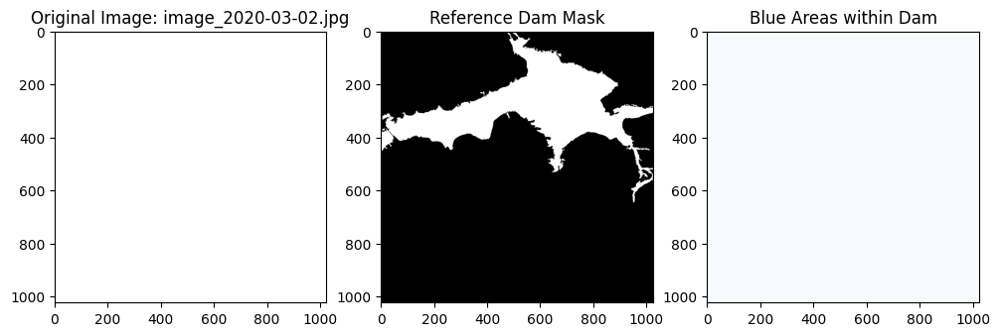

Processed image_2020-03-05.jpg, Blue Area: 4.79%, Blue Regions: [953, 620, 3, 9]; [962, 601, 4, 4]; [1018, 550, 2, 2]; [981, 525, 2, 2]; [1015, 518, 1, 1]; [1006, 517, 1, 1]; [660, 507, 6, 5]; [669, 502, 2, 2]; [642, 496, 4, 3]; [673, 494, 2, 3]; [656, 493, 6, 8]; [647, 493, 1, 1]; [641, 491, 2, 1]; [981, 488, 1, 1]; [629, 482, 1, 1]; [642, 480, 1, 1]; [971, 479, 4, 4]; [971, 476, 1, 2]; [650, 472, 4, 2]; [649, 467, 1, 1]; [649, 465, 2, 1]; [967, 464, 5, 8]; [966, 462, 1, 1]; [650, 460, 1, 1]; [672, 456, 11, 24]; [651, 453, 3, 7]; [963, 451, 4, 10]; [649, 449, 1, 1]; [263, 449, 1, 1]; [947, 447, 1, 1]; [973, 445, 1, 2]; [643, 441, 1, 2]; [242, 441, 1, 1]; [949, 438, 1, 1]; [635, 438, 1, 1]; [946, 437, 1, 1]; [637, 437, 1, 1]; [20, 437, 4, 7]; [36, 436, 1, 1]; [13, 435, 6, 6]; [238, 434, 1, 1]; [35, 434, 1, 1]; [917, 432, 2, 2]; [270, 430, 1, 2]; [36, 430, 5, 6]; [626, 429, 7, 8]; [20, 429, 6, 4]; [28, 427, 1, 1]; [946, 426, 1, 1]; [627, 425, 3, 3]; [945, 424, 1, 1]; [627, 422, 1, 1]; [

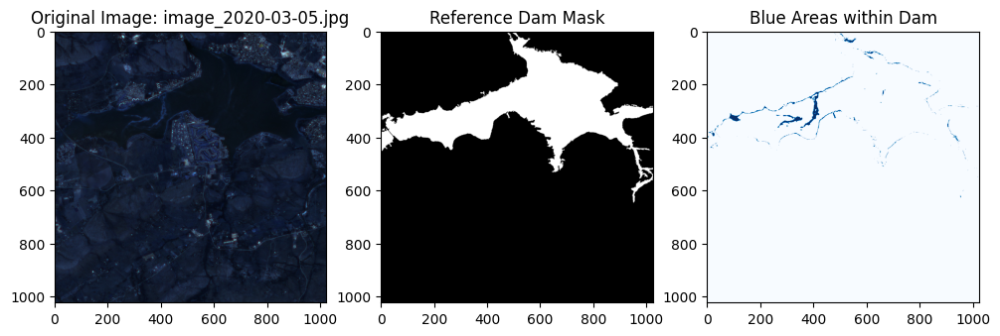

Processed image_2020-03-07.jpg, Blue Area: 5.61%, Blue Regions: [954, 643, 1, 1]; [948, 643, 2, 4]; [952, 620, 4, 12]; [962, 602, 3, 3]; [949, 601, 1, 1]; [943, 593, 1, 1]; [946, 592, 3, 2]; [962, 587, 4, 7]; [959, 584, 1, 1]; [970, 578, 1, 1]; [960, 576, 3, 2]; [967, 575, 2, 2]; [963, 574, 2, 3]; [964, 572, 1, 1]; [979, 571, 3, 2]; [968, 571, 2, 3]; [983, 569, 1, 1]; [969, 569, 1, 1]; [986, 567, 5, 3]; [971, 567, 2, 2]; [974, 566, 3, 1]; [991, 565, 1, 1]; [996, 564, 1, 1]; [1000, 562, 1, 1]; [993, 562, 2, 3]; [1011, 559, 1, 1]; [1016, 553, 2, 2]; [972, 553, 1, 1]; [1018, 550, 2, 2]; [1000, 548, 4, 4]; [975, 547, 1, 1]; [992, 546, 1, 4]; [1000, 544, 3, 3]; [986, 543, 1, 1]; [1023, 542, 1, 1]; [1022, 539, 1, 1]; [973, 539, 1, 1]; [1020, 538, 1, 1]; [975, 538, 1, 1]; [986, 536, 2, 2]; [1005, 535, 7, 4]; [1007, 533, 3, 2]; [971, 533, 1, 2]; [648, 532, 4, 2]; [1016, 531, 2, 3]; [654, 531, 2, 2]; [980, 529, 6, 7]; [643, 529, 4, 3]; [1001, 528, 1, 1]; [660, 526, 1, 1]; [657, 526, 2, 2]; [979

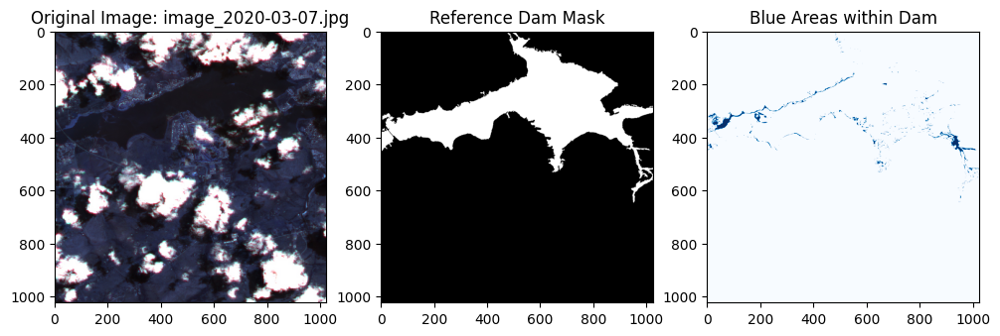

Processed image_2020-03-10.jpg, Blue Area: 2.51%, Blue Regions: [954, 643, 1, 1]; [948, 643, 1, 1]; [954, 641, 1, 1]; [951, 620, 5, 12]; [961, 600, 5, 5]; [971, 592, 2, 2]; [1011, 559, 1, 1]; [1018, 550, 2, 2]; [1002, 548, 2, 2]; [1016, 531, 1, 1]; [981, 525, 2, 2]; [1006, 517, 1, 1]; [987, 516, 1, 1]; [660, 506, 5, 5]; [671, 501, 1, 1]; [648, 497, 1, 1]; [970, 496, 1, 2]; [651, 496, 1, 1]; [642, 495, 4, 3]; [970, 493, 1, 2]; [655, 492, 8, 7]; [647, 492, 2, 2]; [650, 490, 1, 1]; [641, 490, 2, 2]; [969, 476, 6, 7]; [971, 473, 1, 1]; [650, 473, 2, 1]; [968, 466, 5, 6]; [967, 464, 1, 1]; [652, 464, 1, 1]; [964, 456, 3, 6]; [649, 452, 5, 9]; [960, 449, 4, 5]; [649, 449, 1, 1]; [949, 448, 1, 1]; [262, 448, 3, 2]; [1009, 447, 1, 1]; [1004, 446, 3, 2]; [259, 446, 2, 2]; [973, 445, 2, 2]; [939, 443, 2, 5]; [258, 443, 1, 1]; [683, 442, 1, 1]; [23, 442, 1, 1]; [943, 441, 8, 7]; [685, 441, 2, 2]; [643, 441, 4, 5]; [22, 440, 1, 1]; [635, 438, 1, 1]; [935, 437, 6, 5]; [253, 437, 1, 1]; [928, 433, 1

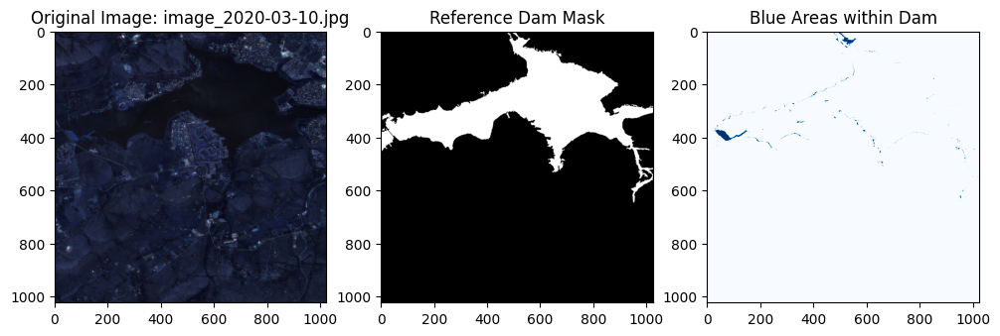

Processed image_2020-03-12.jpg, Blue Area: 2.12%, Blue Regions: [549, 326, 2, 1]; [378, 288, 8, 8]; [656, 280, 1, 3]; [450, 270, 3, 2]; [355, 263, 1, 1]; [375, 255, 1, 1]; [381, 251, 1, 1]; [519, 250, 4, 4]; [434, 250, 9, 2]; [501, 249, 1, 1]; [463, 249, 2, 1]; [383, 249, 4, 2]; [391, 247, 2, 2]; [455, 246, 1, 1]; [524, 244, 3, 6]; [394, 244, 3, 3]; [613, 237, 7, 11]; [616, 236, 1, 1]; [470, 236, 2, 2]; [389, 236, 1, 1]; [381, 233, 3, 1]; [448, 232, 1, 1]; [426, 232, 1, 1]; [388, 232, 2, 2]; [385, 232, 1, 1]; [375, 231, 5, 6]; [519, 229, 6, 5]; [385, 229, 3, 2]; [528, 228, 13, 17]; [398, 228, 27, 16]; [458, 227, 2, 5]; [446, 227, 2, 3]; [428, 227, 1, 1]; [410, 225, 2, 2]; [468, 223, 7, 5]; [551, 220, 3, 2]; [545, 218, 3, 3]; [508, 218, 4, 3]; [487, 218, 3, 2]; [485, 218, 1, 2]; [526, 217, 7, 9]; [468, 217, 4, 2]; [447, 217, 3, 2]; [537, 216, 5, 2]; [529, 215, 1, 1]; [644, 213, 1, 1]; [531, 212, 2, 2]; [468, 212, 1, 1]; [463, 212, 3, 2]; [643, 211, 1, 1]; [563, 205, 5, 3]; [535, 204, 5,

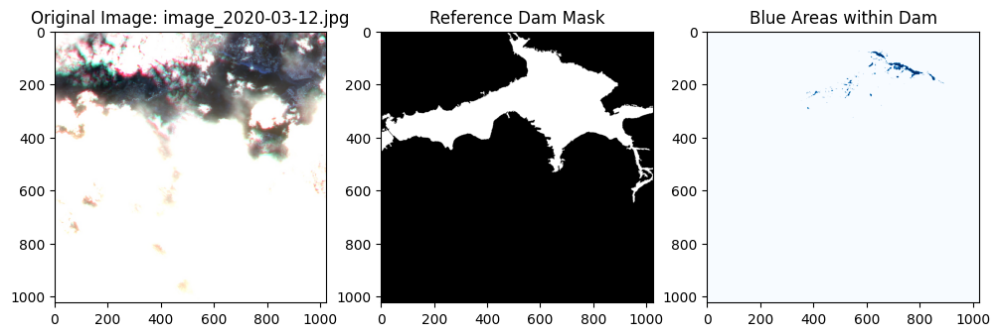

Processed image_2020-03-15.jpg, Blue Area: 3.31%, Blue Regions: [954, 622, 2, 6]; [953, 620, 1, 1]; [964, 601, 2, 2]; [1018, 550, 2, 2]; [982, 526, 1, 1]; [1006, 517, 1, 1]; [657, 496, 4, 3]; [642, 495, 4, 3]; [647, 493, 1, 1]; [641, 491, 2, 1]; [972, 480, 2, 2]; [673, 479, 1, 1]; [673, 475, 1, 2]; [650, 473, 1, 1]; [967, 464, 1, 1]; [965, 456, 1, 2]; [963, 452, 1, 2]; [650, 452, 5, 9]; [649, 449, 1, 1]; [1008, 447, 1, 1]; [935, 447, 2, 1]; [681, 446, 1, 1]; [643, 441, 1, 1]; [22, 440, 1, 1]; [936, 439, 2, 2]; [689, 439, 1, 1]; [949, 438, 1, 1]; [635, 438, 1, 1]; [691, 437, 1, 1]; [637, 437, 1, 1]; [694, 434, 2, 2]; [627, 433, 4, 4]; [39, 433, 1, 1]; [39, 431, 1, 1]; [630, 430, 2, 1]; [272, 422, 1, 1]; [45, 417, 1, 1]; [712, 416, 1, 2]; [697, 415, 15, 19]; [629, 410, 3, 2]; [859, 409, 2, 1]; [638, 409, 1, 1]; [624, 409, 4, 1]; [942, 408, 2, 1]; [739, 401, 1, 1]; [288, 401, 1, 1]; [48, 401, 1, 1]; [632, 400, 3, 1]; [630, 400, 1, 1]; [619, 400, 2, 1]; [40, 400, 7, 20]; [623, 399, 4, 2]; 

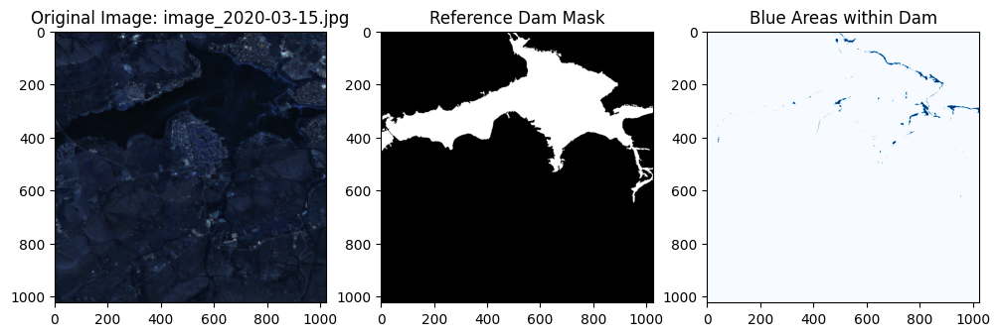

Processed image_2020-03-17.jpg, Blue Area: 0.00%, Blue Regions: 


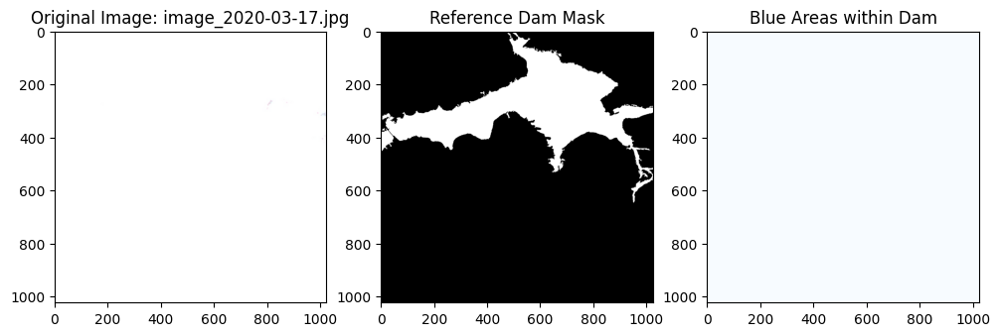

Processed image_2020-03-20.jpg, Blue Area: 9.92%, Blue Regions: [948, 643, 1, 1]; [954, 641, 1, 1]; [951, 620, 5, 11]; [961, 597, 7, 9]; [971, 592, 2, 2]; [1006, 571, 1, 1]; [1008, 569, 4, 2]; [1018, 550, 2, 2]; [1016, 531, 1, 1]; [981, 524, 2, 3]; [659, 509, 7, 2]; [975, 505, 1, 3]; [972, 502, 2, 2]; [670, 500, 2, 2]; [970, 497, 1, 2]; [651, 496, 1, 1]; [647, 496, 2, 2]; [673, 494, 1, 2]; [657, 494, 4, 5]; [642, 494, 4, 4]; [646, 492, 3, 2]; [641, 490, 2, 2]; [674, 489, 1, 3]; [972, 480, 3, 4]; [971, 476, 1, 1]; [971, 473, 1, 1]; [649, 467, 1, 1]; [968, 466, 5, 6]; [649, 465, 1, 1]; [966, 461, 2, 4]; [650, 460, 1, 1]; [964, 455, 2, 5]; [963, 452, 1, 1]; [649, 452, 5, 7]; [1012, 449, 1, 1]; [1010, 449, 1, 1]; [988, 449, 1, 1]; [649, 449, 1, 1]; [984, 448, 1, 1]; [960, 448, 2, 2]; [980, 447, 2, 1]; [970, 447, 1, 1]; [940, 447, 1, 1]; [268, 446, 2, 2]; [1000, 445, 10, 5]; [646, 445, 1, 1]; [973, 444, 1, 2]; [944, 443, 2, 2]; [242, 441, 1, 1]; [271, 440, 1, 2]; [22, 440, 1, 1]; [935, 437,

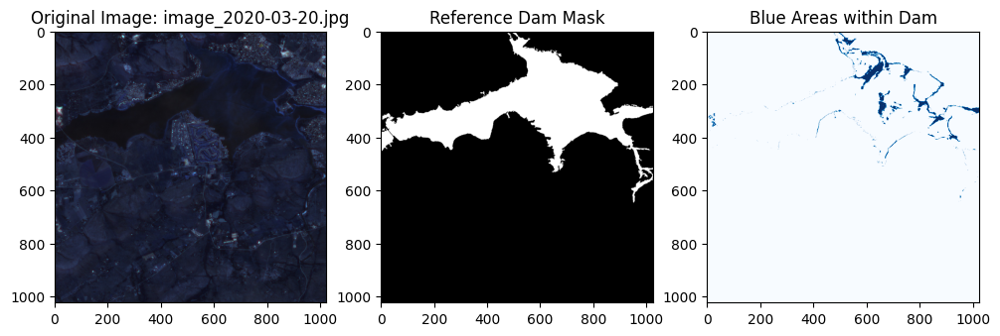

Processed image_2020-03-22.jpg, Blue Area: 0.00%, Blue Regions: 


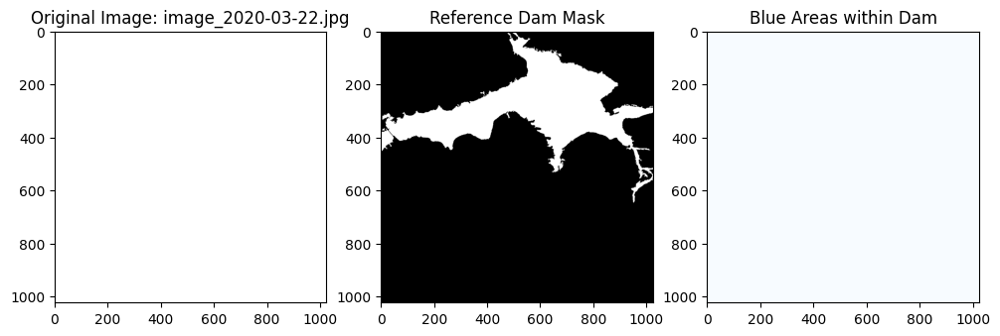

Processed image_2020-03-25.jpg, Blue Area: 22.88%, Blue Regions: [955, 625, 1, 1]; [965, 601, 1, 1]; [1019, 550, 1, 1]; [1001, 544, 2, 2]; [1020, 538, 1, 1]; [982, 526, 1, 1]; [1006, 517, 1, 1]; [660, 509, 2, 2]; [644, 497, 5, 3]; [657, 496, 4, 4]; [643, 496, 1, 1]; [647, 493, 1, 1]; [641, 490, 2, 3]; [981, 488, 1, 1]; [979, 487, 1, 1]; [973, 481, 1, 1]; [971, 478, 1, 1]; [650, 473, 2, 1]; [674, 472, 1, 1]; [967, 464, 1, 1]; [665, 464, 4, 4]; [680, 462, 1, 1]; [964, 455, 2, 4]; [651, 452, 3, 8]; [963, 451, 1, 2]; [649, 449, 1, 1]; [681, 445, 1, 2]; [685, 441, 2, 2]; [643, 441, 5, 5]; [22, 440, 1, 1]; [646, 439, 1, 1]; [949, 438, 1, 1]; [688, 437, 4, 3]; [39, 431, 1, 1]; [626, 429, 12, 10]; [627, 422, 3, 6]; [627, 420, 1, 1]; [693, 418, 19, 19]; [634, 411, 14, 14]; [638, 409, 1, 1]; [623, 409, 12, 4]; [639, 407, 1, 1]; [934, 406, 19, 26]; [617, 398, 21, 4]; [871, 397, 20, 9]; [295, 397, 1, 1]; [882, 396, 1, 1]; [300, 395, 1, 1]; [302, 394, 1, 1]; [615, 391, 4, 6]; [613, 388, 2, 2]; [839

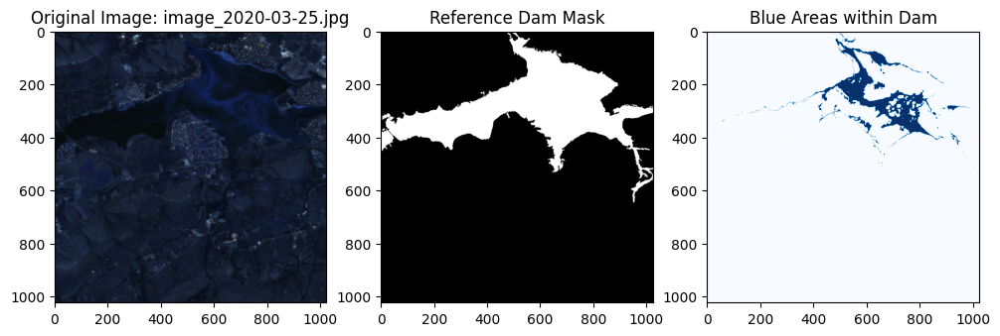

Processed image_2020-03-27.jpg, Blue Area: 14.54%, Blue Regions: [1018, 550, 2, 2]; [672, 518, 1, 5]; [660, 507, 3, 5]; [670, 503, 1, 1]; [651, 496, 1, 2]; [657, 494, 5, 6]; [655, 494, 1, 1]; [647, 492, 3, 2]; [650, 490, 3, 4]; [641, 490, 9, 10]; [638, 490, 2, 2]; [973, 483, 2, 2]; [661, 480, 1, 1]; [652, 480, 1, 1]; [650, 473, 2, 1]; [957, 472, 3, 8]; [970, 469, 1, 1]; [954, 468, 1, 1]; [954, 462, 2, 4]; [953, 460, 1, 1]; [952, 455, 1, 3]; [951, 452, 1, 2]; [962, 450, 2, 3]; [1012, 449, 1, 2]; [984, 448, 1, 1]; [986, 447, 3, 3]; [981, 447, 1, 1]; [970, 447, 1, 1]; [947, 447, 1, 1]; [1000, 445, 10, 5]; [945, 445, 1, 1]; [972, 444, 4, 3]; [681, 444, 1, 2]; [1000, 443, 2, 2]; [990, 443, 4, 4]; [961, 442, 2, 1]; [654, 442, 12, 15]; [643, 441, 20, 39]; [935, 437, 5, 5]; [688, 437, 4, 3]; [928, 435, 1, 1]; [917, 433, 1, 1]; [693, 433, 5, 4]; [670, 423, 17, 26]; [952, 416, 1, 1]; [697, 416, 3, 2]; [695, 416, 1, 1]; [945, 415, 1, 1]; [951, 414, 1, 1]; [949, 414, 1, 1]; [638, 409, 1, 1]; [943,

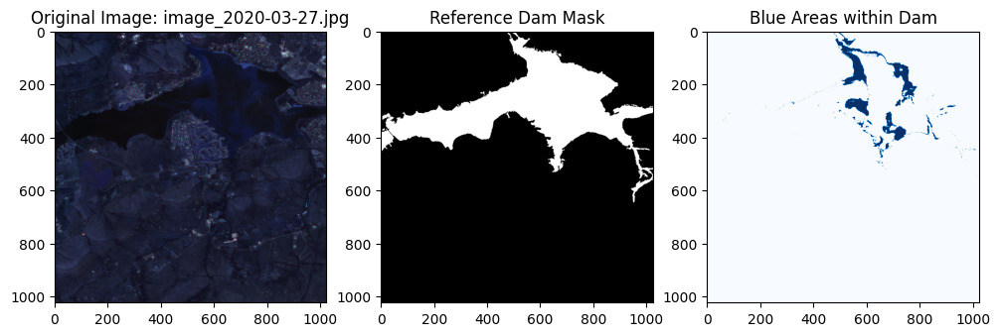

Processed image_2020-03-30.jpg, Blue Area: 0.00%, Blue Regions: 


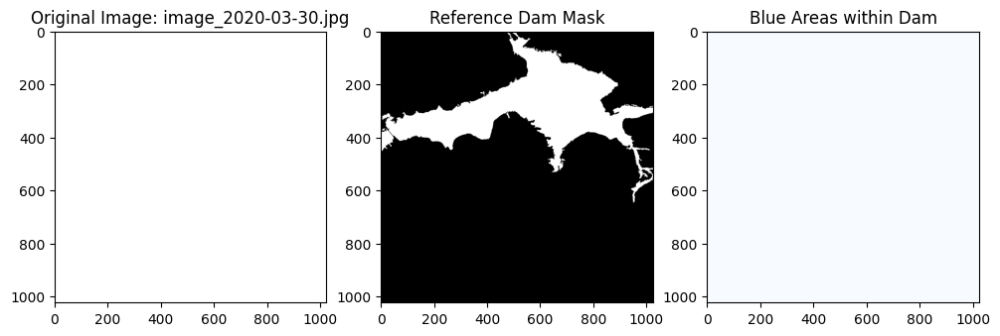

In [109]:
# Check if the reference dam mask was successfully created
if reference_dam_mask is not None:
    # Step 2: Process all images in the folder and save the results to a CSV file
    folder_path = 'C:/Users/Kennedy/Documents/BelgiumCampus/school work/Third year/Final Project/Final Model/downloaded_images_COPERNICUS/Example'
    output_csv_path = 'Dam_area_data.csv'
    process_images_in_folder(folder_path, reference_dam_mask, output_csv_path)


Now lets add to the missing dates and handle interloaping the data

In [93]:
import pandas as pd
from datetime import datetime, timedelta

# Load the dataset
file_path = 'Dam_area_data.csv'
df = pd.read_csv(file_path)

# Function to extract date from the Image Filename
def extract_date(image_filename):
    # Extract the date part from the filename
    try:
        date_str = image_filename.split('_')[1].split('.')[0]
        return datetime.strptime(date_str, '%Y-%m-%d')
    except Exception as e:
        print(f"Error parsing date from filename '{image_filename}': {e}")
        return pd.NaT

# Extract dates from the Image Filename
df['Date'] = df['Image Name'].apply(extract_date)

# Drop the Image Filename column
df.drop(columns=['Image Name'], inplace=True)

# Ensure 'Date' column is sorted
df.sort_values(by='Date', inplace=True)

# Create a date range from the minimum to the maximum date in the dataset
start_date = df['Date'].min()
end_date = df['Date'].max()
all_dates = pd.date_range(start=start_date, end=end_date, freq='D')

# Create a DataFrame with all dates
all_dates_df = pd.DataFrame({'Date': all_dates})

# Merge with the original DataFrame to include missing dates
df = pd.merge(all_dates_df, df, on='Date', how='left')

# Save the updated dataset with missing dates added
output_path = 'Updated_dam_area_data.csv'
df.to_csv(output_path, index=False)

print("Date extraction, column drop, and missing dates addition complete. Updated dataset saved.")


Date extraction, column drop, and missing dates addition complete. Updated dataset saved.


In [101]:
import pandas as pd
import numpy as np

# Load the dataset with the date column already added
file_path = 'Updated_dam_area_data.csv'
df = pd.read_csv(file_path)

# Replace '0.0%' with NaN to treat them as missing values
df['Blue Area Percentage'] = df['Blue Area Percentage'].replace('0.00%', np.nan)

# Function to convert percentage string to float, handle both string and numeric values
def convert_percentage_to_float(value):
    if isinstance(value, str):
        try:
            return float(value.strip('%'))
        except ValueError:
            return np.nan
    elif isinstance(value, (int, float)):
        return float(value)
    else:
        return np.nan

# Function to convert float back to percentage string
def convert_float_to_percentage(value):
    if pd.isna(value):
        return '0.0%'
    return f"{value:.1f}%"

# Convert Blue Area Percentage to numeric values for interpolation
df['Blue Area Percentage Numeric'] = df['Blue Area Percentage'].apply(convert_percentage_to_float)

# Interpolate Blue Area Percentage for missing values
df['Blue Area Percentage Numeric'] = df['Blue Area Percentage Numeric'].interpolate(method='linear')

# Convert interpolated values back to percentage format
df['Blue Area Percentage'] = df['Blue Area Percentage Numeric'].apply(convert_float_to_percentage)

# Drop the intermediate numeric column used for interpolation
df.drop(columns=['Blue Area Percentage Numeric'], inplace=True)

# Save the updated dataset with interpolated Blue Area Percentages
output_path = 'Interpolated_dam_area_data.csv'
df.to_csv(output_path, index=False)

print("Interpolation complete. Dataset with updated Blue Area Percentage saved.")


Interpolation complete. Dataset with updated Blue Area Percentage saved.


In [103]:
import pandas as pd
import ast

# Load the provided dataset
file_path = 'Interpolated_dam_area_data.csv'
df = pd.read_csv(file_path)

# Function to parse Blue Region Bounding Boxes and count the number of regions
def parse_blue_regions(region_str):
    if pd.isna(region_str) or region_str.strip() == '':
        return []
    try:
        return [ast.literal_eval(box.strip()) for box in region_str.split(';') if box.strip()]
    except:
        return []

# Apply the function to parse bounding boxes
df['Parsed Regions'] = df['Blue Region Bounding Boxes'].apply(parse_blue_regions)

# Function to interpolate bounding boxes
def interpolate_bounding_boxes(start_boxes, end_boxes, num_steps):
    interpolated_boxes = []
    
    max_len = max(len(start_boxes), len(end_boxes))
    
    # Padding to make sure the lists are of equal length
    start_boxes += [[0, 0, 0, 0]] * (max_len - len(start_boxes))
    end_boxes += [[0, 0, 0, 0]] * (max_len - len(end_boxes))
    
    # Generate interpolated boxes for each step across all bounding boxes
    for step in range(1, num_steps):
        step_boxes = []
        for i in range(max_len):
            start_box = start_boxes[i]
            end_box = end_boxes[i]
            interp_box = [
                start_box[0] + (end_box[0] - start_box[0]) * step / (num_steps - 1),
                start_box[1] + (end_box[1] - start_box[1]) * step / (num_steps - 1),
                start_box[2] + (end_box[2] - start_box[2]) * step / (num_steps - 1),
                start_box[3] + (end_box[3] - start_box[3]) * step / (num_steps - 1),
            ]
            step_boxes.append(interp_box)
        interpolated_boxes.append(step_boxes)
    
    return interpolated_boxes

# Interpolate Blue Region Bounding Boxes across missing dates
def interpolate_regions(df):
    interpolated_rows = []

    for i in range(1, len(df)):
        if len(df.loc[i, 'Parsed Regions']) == 0:  # Find rows with missing regions
            prev_idx = i - 1
            next_idx = i + 1

            # Find the previous row with non-empty regions
            while prev_idx >= 0 and len(df.loc[prev_idx, 'Parsed Regions']) == 0:
                prev_idx -= 1

            # Find the next row with non-empty regions
            while next_idx < len(df) and len(df.loc[next_idx, 'Parsed Regions']) == 0:
                next_idx += 1

            # Interpolate if we found valid previous and next rows
            if prev_idx >= 0 and next_idx < len(df):
                start_boxes = df.loc[prev_idx, 'Parsed Regions']
                end_boxes = df.loc[next_idx, 'Parsed Regions']
                num_steps = next_idx - prev_idx

                # Debug: Print the values being interpolated
                print(f"Interpolating between rows {prev_idx} and {next_idx}:")
                print(f"Start Boxes: {start_boxes}")
                print(f"End Boxes: {end_boxes}")

                interpolated_boxes = interpolate_bounding_boxes(start_boxes, end_boxes, num_steps)

                # Debug: Print the interpolated boxes
                print(f"Interpolated Boxes: {interpolated_boxes}")

                # Assign interpolated values to missing dates
                for step in range(1, num_steps):
                    df.at[prev_idx + step, 'Parsed Regions'] = interpolated_boxes[step - 1]
                    interpolated_rows.append(prev_idx + step)

    return df, interpolated_rows

# Apply the region interpolation function
df, interpolated_rows = interpolate_regions(df)

# Convert Parsed Regions back to the original format
def format_bounding_boxes(boxes):
    return '; '.join([str(box) for box in boxes])

# Format the interpolated bounding boxes back to their original format
df['Blue Region Bounding Boxes'] = df['Parsed Regions'].apply(format_bounding_boxes)

# Ensure that Blue Area Percentage is set to 0.0% where regions are missing
df.loc[df['Blue Region Bounding Boxes'].apply(lambda x: len(x.split(';')) == 0), 'Blue Area Percentage'] = '0.0%'

# Save the cleaned and interpolated dataset to a new CSV
output_path = 'Final_Dam_Data.csv'
df.to_csv(output_path, index=False)

print("Interpolation complete. Cleaned dataset saved.")


Interpolating between rows 0 and 3:
Start Boxes: [[923, 277, 8, 3], [806, 277, 2, 2], [798, 277, 2, 2], [289, 277, 1, 1], [913, 276, 7, 7], [810, 276, 1, 1], [798, 274, 1, 1], [816, 272, 2, 1], [800, 272, 1, 1], [302, 272, 5, 4], [804, 270, 4, 1], [309, 270, 3, 2], [815, 269, 2, 2], [810, 268, 1, 1], [800, 268, 2, 1], [817, 267, 1, 1], [314, 265, 32, 13], [350, 264, 4, 2], [486, 263, 1, 1], [355, 263, 2, 1], [358, 261, 3, 2], [488, 260, 1, 1], [362, 260, 1, 1], [364, 259, 1, 1], [366, 258, 1, 1], [368, 255, 3, 3], [376, 252, 4, 3], [381, 251, 1, 1], [818, 244, 28, 46], [550, 244, 9, 6], [398, 244, 1, 1], [394, 244, 1, 1], [848, 241, 6, 4], [850, 240, 1, 1], [397, 238, 7, 4], [858, 233, 6, 3], [490, 233, 1, 3], [549, 232, 3, 1], [420, 230, 3, 1], [433, 228, 1, 1], [424, 228, 3, 3], [375, 228, 19, 23], [552, 227, 2, 4], [438, 227, 1, 1], [436, 227, 1, 1], [428, 227, 4, 1], [405, 225, 14, 14], [551, 224, 1, 2], [440, 224, 1, 1], [870, 223, 1, 1], [550, 220, 1, 1], [444, 220, 1, 1], [551, 

In [2]:
import pandas as pd

# Load the dataset with the date column already added
file_path = 'Final_Dam_Data.csv'
df = pd.read_csv(file_path)

# Drop the 'Parsed Regions' column
df.drop(columns=['Parsed Regions'], inplace=True)

# Display the first few rows to confirm the changes
print(df.head())

# Save the updated DataFrame to a new CSV file
output_path = 'Final_Dam_Data.csv'
df.to_csv(output_path, index=False)

print(f"Updated DataFrame saved to {output_path}.")


KeyError: "['Parsed Regions'] not found in axis"

Make sure all values are integer

In [1]:
import pandas as pd
import re

def convert_bounding_boxes_to_integers(df, column_name):
    """
    Convert the bounding box values in the specified column to integers.
    
    Parameters:
    - df: DataFrame containing the bounding box data
    - column_name: Name of the column containing the bounding boxes
    
    Returns:
    - df: DataFrame with updated bounding box column containing integer values
    """
    updated_bounding_boxes = []

    for bounding_boxes_str in df[column_name]:
        if pd.isna(bounding_boxes_str):
            updated_bounding_boxes.append(bounding_boxes_str)
            continue
        
        # Extract bounding boxes using regex
        pattern = r'\[(\d+\.?\d*), (\d+\.?\d*), (\d+\.?\d*), (\d+\.?\d*)\]'
        matches = re.findall(pattern, bounding_boxes_str)

        # Convert to integers and format them back
        int_bounding_boxes = []
        for match in matches:
            x, y, w, h = map(float, match)
            int_bounding_boxes.append(f"[{int(round(x))}, {int(round(y))}, {int(round(w))}, {int(round(h))}]")
        
        # Join the bounding boxes back into the string format
        updated_bounding_boxes.append('; '.join(int_bounding_boxes))
    
    # Update the DataFrame column
    df[column_name] = updated_bounding_boxes
    return df

# Example usage
csv_file_path = 'Interpolated_Dam_File.csv'
df = pd.read_csv(csv_file_path)

# Convert bounding boxes to integer format
df = convert_bounding_boxes_to_integers(df, 'Blue Region Bounding Boxes')

# Save the updated DataFrame back to CSV
df.to_csv('Interpolated_Dam_File_Refined.csv', index=False)

print("Bounding boxes have been converted to integers and saved to the updated CSV.")


Bounding boxes have been converted to integers and saved to the updated CSV.


NOw we try and visualize the all the images

In [19]:
import cv2
import numpy as np
import pandas as pd
import os
import re

def draw_bounding_boxes(image, bounding_boxes):
    """
    Draw bounding boxes on an image.
    
    Parameters:
    - image: np.ndarray, the image on which to draw the bounding boxes
    - bounding_boxes: list of bounding boxes in the format [(x, y, w, h), ...]
    
    Returns:
    - image_with_boxes: np.ndarray, the image with bounding boxes drawn
    """
    image_with_boxes = image.copy()
    
    for (x, y, w, h) in bounding_boxes:
        cv2.rectangle(image_with_boxes, (x, y), (x+w, y+h), (0, 255, 0), 2)  # Draw the rectangle
    
    return image_with_boxes

def process_csv_and_visualize(csv_file_path, reference_image_path, output_folder):
    """
    Process the CSV file to visualize bounding boxes and save images.
    
    Parameters:
    - csv_file_path: str, the path to the CSV file containing bounding box data
    - reference_image_path: str, the path to the reference image used as the background
    - output_folder: str, the path to the folder where the output images will be saved
    """
    # Load the reference image
    reference_image = cv2.imread(reference_image_path)
    if reference_image is None:
        print(f"Error: Reference image not found or unable to load at path {reference_image_path}")
        return

    # Load the CSV file
    df = pd.read_csv(csv_file_path)

    # Ensure output folder exists
    os.makedirs(output_folder, exist_ok=True)
    
    for index, row in df.iterrows():
        # Ensure the bounding box string is treated as a string
        bounding_boxes_str = str(row['Blue Region Bounding Boxes'])
        
        bounding_boxes = []
        
        # Check if the bounding_boxes_str is not empty or NaN
        if bounding_boxes_str and bounding_boxes_str.strip() != 'nan':
            # Find all bounding boxes using regular expressions
            pattern = r'\[(\d+), (\d+), (\d+), (\d+)\]'
            matches = re.findall(pattern, bounding_boxes_str)
            
            for match in matches:
                x, y, w, h = map(int, match)
                bounding_boxes.append((x, y, w, h))
        
        # Draw bounding boxes on the reference image
        image_with_boxes = draw_bounding_boxes(reference_image, bounding_boxes)
        
        # Save the result image
        output_image_path = os.path.join(output_folder, f"{row['Date']}_bounding_boxes.png")
        cv2.imwrite(output_image_path, image_with_boxes)
        print(f"Saved image with bounding boxes: {output_image_path}")

# Example usage
csv_file_path = 'Interpolated_Dam_File_Refined.csv'
reference_image_path = 'Reference image\image_2020-05-29.jpg'
output_folder = 'Output_Images'

process_csv_and_visualize(csv_file_path, reference_image_path, output_folder)


Saved image with bounding boxes: Output_Images\2020-01-02_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-03_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-04_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-05_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-06_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-07_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-08_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-09_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-10_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-11_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-12_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-13_bounding_boxes.png
Saved image with bounding boxes: Output_Images\2020-01-14_bounding_boxes.png

Now we can see how the data basically interacts and the we can now also see if the new images and the Interpolated_Dam Data looks like in the model

Now lets Merge the File data with the weather data and train the model

In [5]:
import pandas as pd

# File paths
dam_file_path = 'Interpolated_Dam_File_Refined.csv'
weather_file_path = 'daily_weather_data_extended.csv'
output_file_path = 'Merged_Dam_Weather_Data.csv'

# Load the CSV files into DataFrames
df_dam = pd.read_csv(dam_file_path)
df_weather = pd.read_csv(weather_file_path)

# Ensure both dataframes have the 'date' column in a consistent format
df_dam['Date'] = pd.to_datetime(df_dam['Date'])
df_weather['Date'] = pd.to_datetime(df_weather['Date'])

# Merge the two DataFrames on the 'date' column using an inner join to keep only the matching dates
df_merged = pd.merge(df_weather, df_dam, on='Date', how='inner')

# Drop the last three rows
df_merged = df_merged[:-3]

# Save the merged DataFrame to a new CSV file
df_merged.to_csv(output_file_path, index=False)

print(f"Merged data (with the last three rows dropped) has been saved to {output_file_path}")


KeyError: 'Date'

Temporal Features:

Day of the Year / Month: Water dynamics and environmental factors might vary across seasons (e.g., water evaporation during summer, plant bloom periods).
Time since last satellite image: If images aren’t captured daily, objects may drift further after longer periods.
Historical Data:

Lagged Features: Use the values of the blue regions or weather from previous days as additional inputs. This can help the model capture trends and movement patterns over time.
Moving Averages: Use a moving average or rolling window of weather conditions over a few days to smooth out any noise in the data and provide more consistent trends.
Blue Region Features:

Total Blue Area: Already included as a feature but focusing more on regional concentration (e.g., areas with the highest densities).
Distance from previous location: How far the blue object has moved from its previous position can capture movement patterns.


In [30]:
import pandas as pd

# Load dataset
df = pd.read_csv('Merged_Dam_Weather_Data.csv')

# Extract date-based features
df['Date'] = pd.to_datetime(df['Date'])
df['month'] = df['Date'].dt.month
df['day_of_year'] = df['Date'].dt.dayofyear

# Temperature range
df['temperature_range'] = df['temperature_2m_max'] - df['temperature_2m_min']

# Humidity range
df['humidity_range'] = df['relative_humidity_2m_max'] - df['relative_humidity_2m_min']

# Pressure range
df['pressure_range'] = df['surface_pressure_max'] - df['surface_pressure_min']

# Rain intensity
df['rain_intensity'] = df['precipitation_sum'] / (df['temperature_2m_max'] - df['temperature_2m_min']).replace(0, 1)  # Avoid division by zero

# Wind power
df['wind_power'] = df['wind_speed_10m_max'] * df['wind_gusts_10m_max']

# Rolling statistics (3-day and 7-day)
df['temperature_2m_mean_3d_avg'] = df['temperature_2m_mean'].rolling(window=3).mean()
df['temperature_2m_mean_7d_avg'] = df['temperature_2m_mean'].rolling(window=7).mean()

df['precipitation_sum_3d_total'] = df['precipitation_sum'].rolling(window=3).sum()
df['precipitation_sum_7d_total'] = df['precipitation_sum'].rolling(window=7).sum()

df['humidity_2m_mean_3d_avg'] = df['humidity_range'].rolling(window=3).mean()
df['humidity_2m_mean_7d_avg'] = df['humidity_range'].rolling(window=7).mean()

# Lag features
for lag in range(1, 4):
    df[f'temp_lag_{lag}'] = df['temperature_2m_mean'].shift(lag)
    df[f'blue_area_lag_{lag}'] = df['Blue Area Percentage'].shift(lag)

# Replace NaN values with 0 for all columns
df.fillna(0, inplace=True)

# Get all columns except 'Blue Area Percentage' and 'Blue Region Bounding Boxes'
new_columns = [col for col in df.columns if col not in ['Blue Area Percentage', 'Blue Region Bounding Boxes']]

# Append 'Blue Area Percentage' and 'Blue Region Bounding Boxes' as the last columns
new_columns += ['Blue Area Percentage', 'Blue Region Bounding Boxes']

# Reorder the DataFrame
df = df[new_columns]

df['Blue Area Percentage'] = df['Blue Area Percentage'].astype(str).str.replace('%', '', regex=False).astype(float)

df['blue_area_lag_1'] = df['blue_area_lag_1'].astype(str).str.replace('%', '', regex=False).astype(float)
df['blue_area_lag_2'] = df['blue_area_lag_2'].astype(str).str.replace('%', '', regex=False).astype(float)
df['blue_area_lag_3'] = df['blue_area_lag_3'].astype(str).str.replace('%', '', regex=False).astype(float)
df['Blue Area Percentage'] = pd.to_numeric(df['Blue Area Percentage'], errors='coerce')
# Round the 'Blue Area Percentage' to 2 decimal places
df['Blue Area Percentage'] = df['Blue Area Percentage'].round(2)
df['blue_area_lag_1'] = df['blue_area_lag_1'].round(2)
df['blue_area_lag_2'] = df['blue_area_lag_2'].round(2)
df['blue_area_lag_3'] = df['blue_area_lag_3'].round(2)

# Check the first few rows to ensure the conversion was successful
print(df[['Blue Area Percentage']].head())

# Save updated data with features
df.to_csv('Merged_Dam_Weather_Data_with_Features.csv', index=False)


   Blue Area Percentage
0                   7.2
1                   6.5
2                   5.7
3                   5.0
4                   4.3


In [31]:
df = pd.read_csv('Merged_Dam_Weather_Data_with_Features.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86 entries, 0 to 85
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Date                         86 non-null     object 
 1   temperature_2m_max           86 non-null     float64
 2   temperature_2m_min           86 non-null     float64
 3   temperature_2m_mean          86 non-null     float64
 4   precipitation_sum            86 non-null     float64
 5   rain_sum                     86 non-null     float64
 6   wind_speed_10m_max           86 non-null     float64
 7   wind_gusts_10m_max           86 non-null     float64
 8   wind_direction_10m_dominant  86 non-null     int64  
 9   shortwave_radiation_sum      86 non-null     float64
 10  surface_pressure_min         86 non-null     float64
 11  surface_pressure_max         86 non-null     float64
 12  relative_humidity_2m_min     86 non-null     int64  
 13  relative_humidity_2m_m

   Blue Area Percentage
0                   7.2
1                   6.5
2                   5.7
3                   5.0
4                   4.3
Correlation of Weather Features with Bounding Box Coordinates (x1, y1, w1, h1):
                                  x1        y1        w1        h1
temperature_range           0.224572  0.039802 -0.194146 -0.151800
humidity_range              0.256311  0.060249 -0.115264 -0.098826
pressure_range              0.095825  0.023779 -0.134832 -0.129926
rain_intensity             -0.048405  0.033650  0.197025  0.124785
wind_power                 -0.217761 -0.229605  0.169582  0.133926
temperature_2m_mean_3d_avg -0.017088  0.338789 -0.091913  0.001279
temperature_2m_mean_7d_avg -0.073341  0.230826  0.095795  0.144146
precipitation_sum_3d_total -0.020505  0.093260  0.434715  0.372994
precipitation_sum_7d_total  0.065849  0.211380  0.351656  0.371891
humidity_2m_mean_3d_avg     0.124801  0.417242 -0.196520 -0.071390
humidity_2m_mean_7d_avg    -0.007549  0

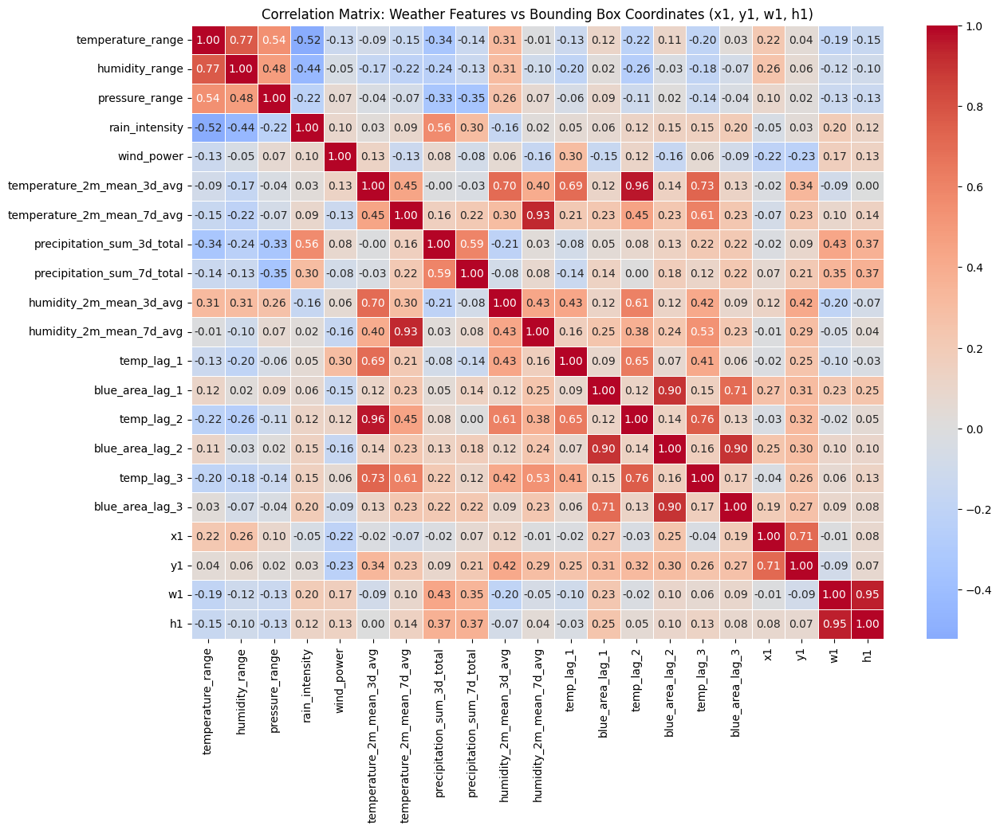

In [32]:
import pandas as pd
import ast

# Load the updated dataset with new features
df = pd.read_csv('Merged_Dam_Weather_Data_with_Features.csv')


df['Blue Area Percentage'] = df['Blue Area Percentage'].astype(str).str.replace('%', '', regex=True).astype(float)

df['Blue Area Percentage'] = pd.to_numeric(df['Blue Area Percentage'], errors='coerce')
# Round the 'Blue Area Percentage' to 2 decimal places
df['Blue Area Percentage'] = df['Blue Area Percentage'].round(2)

# Check the first few rows to ensure the conversion was successful
print(df[['Blue Area Percentage']].head())

# Function to parse Blue Region Bounding Boxes into separate columns for each box's x, y, w, h values
def parse_bounding_boxes(region_str):
    if pd.isna(region_str) or region_str.strip() == '':
        return []
    try:
        # Parse each bounding box string into a list of [x, y, w, h]
        return [ast.literal_eval(box.strip()) for box in region_str.split(';') if box.strip()]
    except Exception as e:
        print(f"Error parsing bounding boxes: {e}")
        return []

# Apply the function to split bounding box data into lists of [x, y, w, h]
df['Parsed Bounding Boxes'] = df['Blue Region Bounding Boxes'].apply(parse_bounding_boxes)

# Create separate columns for the first bounding box
df['x1'], df['y1'], df['w1'], df['h1'] = zip(*df['Parsed Bounding Boxes'].apply(lambda x: x[0] if len(x) > 0 else [None, None, None, None]))

# Drop the original bounding box column and parsed lists if no longer needed
df.drop(columns=['Blue Region Bounding Boxes', 'Parsed Bounding Boxes'], inplace=True)


# Convert all non-numeric columns to numeric if applicable
df['temperature_range'] = pd.to_numeric(df['temperature_range'], errors='coerce')
df['humidity_range'] = pd.to_numeric(df['humidity_range'], errors='coerce')
df['pressure_range'] = pd.to_numeric(df['pressure_range'], errors='coerce')
df['rain_intensity'] = pd.to_numeric(df['rain_intensity'], errors='coerce')
df['wind_power'] = pd.to_numeric(df['wind_power'], errors='coerce')
# Convert all other columns as needed...

# Define the columns of interest for correlation, including the new features and the bounding box coordinates
correlation_columns = ['temperature_range', 'humidity_range', 'pressure_range', 'rain_intensity', 'wind_power', 
                       'temperature_2m_mean_3d_avg', 'temperature_2m_mean_7d_avg', 'precipitation_sum_3d_total', 
                       'precipitation_sum_7d_total', 'humidity_2m_mean_3d_avg', 'humidity_2m_mean_7d_avg', 
                       'temp_lag_1', 'blue_area_lag_1', 'temp_lag_2', 'blue_area_lag_2', 'temp_lag_3', 'blue_area_lag_3', 
                       'x1', 'y1', 'w1', 'h1']

# Compute the correlation matrix
correlation_matrix = df[correlation_columns].corr()

# Display correlation values for each weather feature with bounding box coordinates
print("Correlation of Weather Features with Bounding Box Coordinates (x1, y1, w1, h1):")
print(correlation_matrix[['x1', 'y1', 'w1', 'h1']])

# Optionally, save the correlation matrix to a CSV file for further analysis
correlation_matrix.to_csv('Correlation_Matrix_Bounding_Boxes_and_Weather.csv')

# Visualize the correlation matrix with a heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix: Weather Features vs Bounding Box Coordinates (x1, y1, w1, h1)')
plt.show()


Correlation of Weather Features with Bounding Box Coordinates:
                                   x1        y1        w1        h1
x1                           1.000000  0.710617 -0.010599  0.083033
y1                           0.710617  1.000000 -0.085742  0.073663
surface_pressure_max         0.230328  0.308496 -0.031241  0.052967
surface_pressure_min         0.170017  0.276193  0.033419  0.109545
temperature_2m_max           0.145023 -0.102420 -0.175306 -0.196157
shortwave_radiation_sum      0.121615  0.036875 -0.098021 -0.093412
temperature_2m_mean          0.084032 -0.102572 -0.163207 -0.207621
h1                           0.083033  0.073663  0.948179  1.000000
relative_humidity_2m_max    -0.008047  0.008298  0.210065  0.167274
w1                          -0.010599 -0.085742  1.000000  0.948179
wind_direction_10m_dominant -0.041876 -0.138387 -0.002062 -0.008945
rain_sum                    -0.042107  0.030292  0.232597  0.144719
precipitation_sum           -0.042107  0.030292  0.23

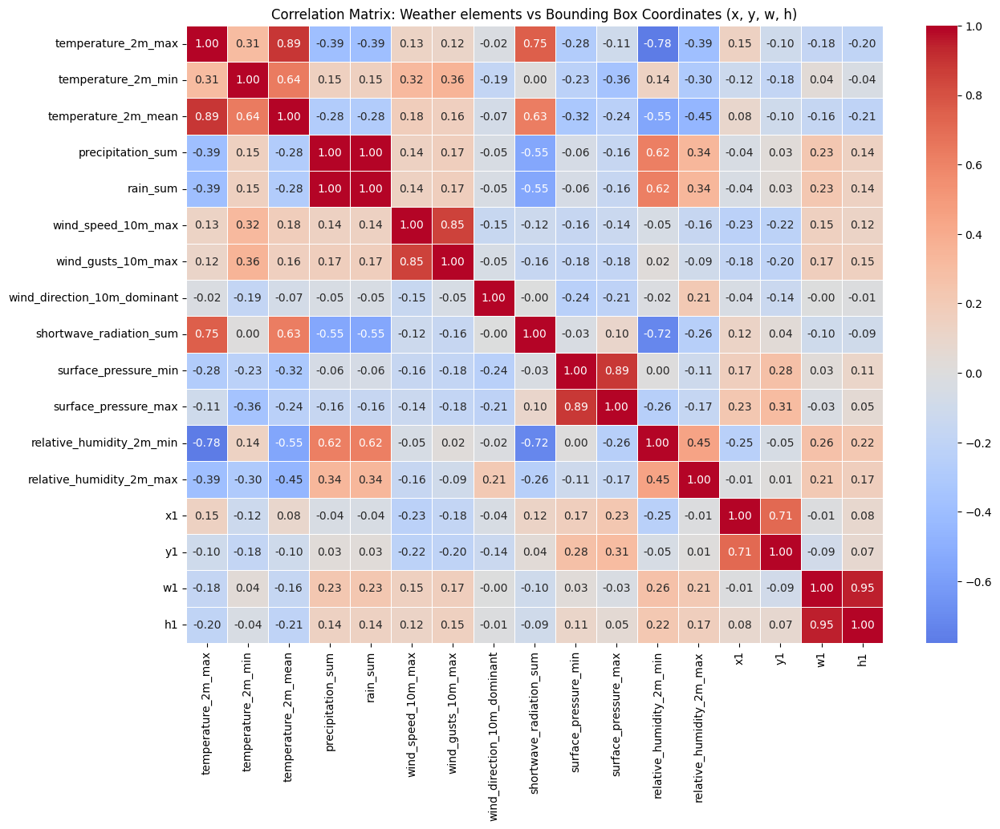

In [47]:
import pandas as pd
import ast
import matplotlib.pyplot as plt
import seaborn as sns

# Load the merged DataFrame
df = pd.read_csv('Merged_Dam_Weather_Data.csv')

# Function to parse Blue Region Bounding Boxes into separate columns for each box's x, y, w, h values
def parse_bounding_boxes(region_str):
    if pd.isna(region_str) or region_str.strip() == '':
        return []
    try:
        # Parse each bounding box string into a list of [x, y, w, h]
        return [ast.literal_eval(box.strip()) for box in region_str.split(';') if box.strip()]
    except Exception as e:
        print(f"Error parsing bounding boxes: {e}")
        return []

# Apply the function to split bounding box data into lists of [x, y, w, h]
df['Parsed Bounding Boxes'] = df['Blue Region Bounding Boxes'].apply(parse_bounding_boxes)

# Now, we'll create separate columns for x, y, w, and h values for each bounding box
# Assuming we're working with the first bounding box for simplicity, but this can be expanded for multiple boxes
df['x1'], df['y1'], df['w1'], df['h1'] = zip(*df['Parsed Bounding Boxes'].apply(lambda x: x[0] if len(x) > 0 else [None, None, None, None]))

# Drop the original bounding box column and parsed lists
df.drop(columns=['Blue Region Bounding Boxes', 'Parsed Bounding Boxes'], inplace=True)

# Define the weather columns
weather_columns = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean', 
                   'precipitation_sum', 'rain_sum', 'wind_speed_10m_max', 'wind_gusts_10m_max', 
                   'wind_direction_10m_dominant', 'shortwave_radiation_sum', 'surface_pressure_min', 
                   'surface_pressure_max', 'relative_humidity_2m_min', 'relative_humidity_2m_max']

# Include the extracted bounding box coordinates for correlation analysis
correlation_columns = weather_columns + ['x1', 'y1', 'w1', 'h1']

# Compute the correlation matrix
correlation_matrix = df[correlation_columns].corr()

# Print correlation values for each weather feature with bounding box coordinates
print("Correlation of Weather Features with Bounding Box Coordinates:")
print(correlation_matrix[['x1', 'y1', 'w1', 'h1']].sort_values(by='x1', ascending=False))

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix: Weather elements vs Bounding Box Coordinates (x, y, w, h)')
plt.show()


Certainly! Below are steps and example code snippets for implementing the three recommendations: Multivariate Regression Analysis, Spatial Analysis, and Time Series Forecasting.

Checking for the first 10 bounding boxes 

Correlation matrix saved to Correlation_Matrix_Bounding_Boxes_and_Weather.csv


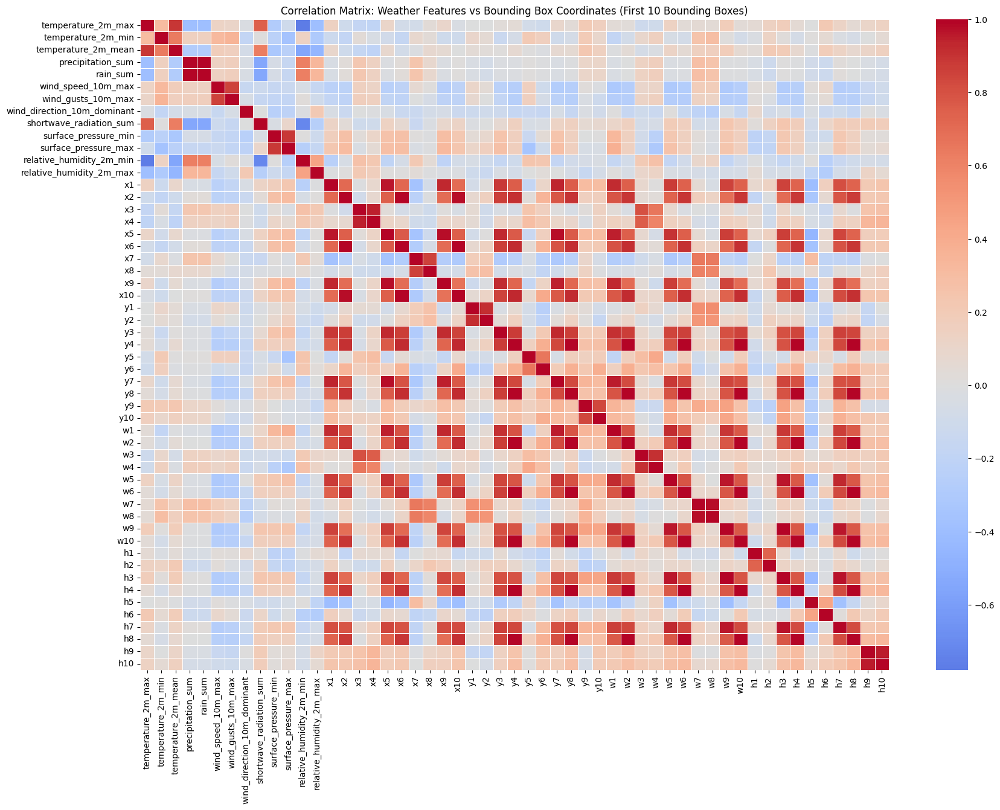

In [5]:
import pandas as pd
import ast
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the merged DataFrame
df = pd.read_csv('Merged_Dam_Weather_Data.csv')

# Function to parse bounding boxes and extract up to the first 10 boxes
def parse_bounding_boxes(region_str, max_boxes=10):
    if pd.isna(region_str) or region_str.strip() == '':
        return [np.nan] * (max_boxes * 4)  # Return NaNs for missing data
    try:
        # Parse bounding boxes as a list of lists [(x, y, w, h), ...]
        bounding_boxes = [ast.literal_eval(box.strip()) for box in region_str.split(';') if box.strip()]
        
        # Extract the first `max_boxes` boxes, filling with NaNs if there are fewer
        boxes_flat = [coord for box in bounding_boxes[:max_boxes] for coord in box]  # Flatten boxes
        while len(boxes_flat) < max_boxes * 4:  # Fill missing with NaN
            boxes_flat.extend([np.nan] * 4)
        return boxes_flat
    except Exception as e:
        print(f"Error parsing bounding boxes: {e}")
        return [np.nan] * (max_boxes * 4)

# Apply the function to extract up to 10 bounding boxes
box_columns = [f'x{i+1}' for i in range(10)] + [f'y{i+1}' for i in range(10)] + [f'w{i+1}' for i in range(10)] + [f'h{i+1}' for i in range(10)]
df[box_columns] = pd.DataFrame(df['Blue Region Bounding Boxes'].apply(lambda x: parse_bounding_boxes(x, max_boxes=10)).tolist(), index=df.index)

# Drop the original 'Blue Region Bounding Boxes' column
df.drop(columns=['Blue Region Bounding Boxes'], inplace=True)

# Convert Blue Area Percentage from string to float
df['Blue Area Percentage'] = df['Blue Area Percentage'].str.replace('%', '').astype(float)

# Define the weather columns
weather_columns = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean', 
                   'precipitation_sum', 'rain_sum', 'wind_speed_10m_max', 'wind_gusts_10m_max', 
                   'wind_direction_10m_dominant', 'shortwave_radiation_sum', 
                   'surface_pressure_min', 'surface_pressure_max', 
                   'relative_humidity_2m_min', 'relative_humidity_2m_max']

# Correlation columns include weather features and bounding box coordinates (first 10 boxes)
correlation_columns = weather_columns + box_columns

# Compute the correlation matrix
correlation_matrix = df[correlation_columns].corr()

# Save correlation matrix to CSV file
output_file = 'Correlation_Matrix_Bounding_Boxes_and_Weather.csv'
correlation_matrix.to_csv(output_file)

# Print a confirmation message
print(f"Correlation matrix saved to {output_file}")

# Optional: Visualize the correlation matrix as a heatmap (optional)
plt.figure(figsize=(20, 14))  # Adjust figure size for a large number of columns
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Correlation Matrix: Weather Features vs Bounding Box Coordinates (First 10 Bounding Boxes)')
plt.show()


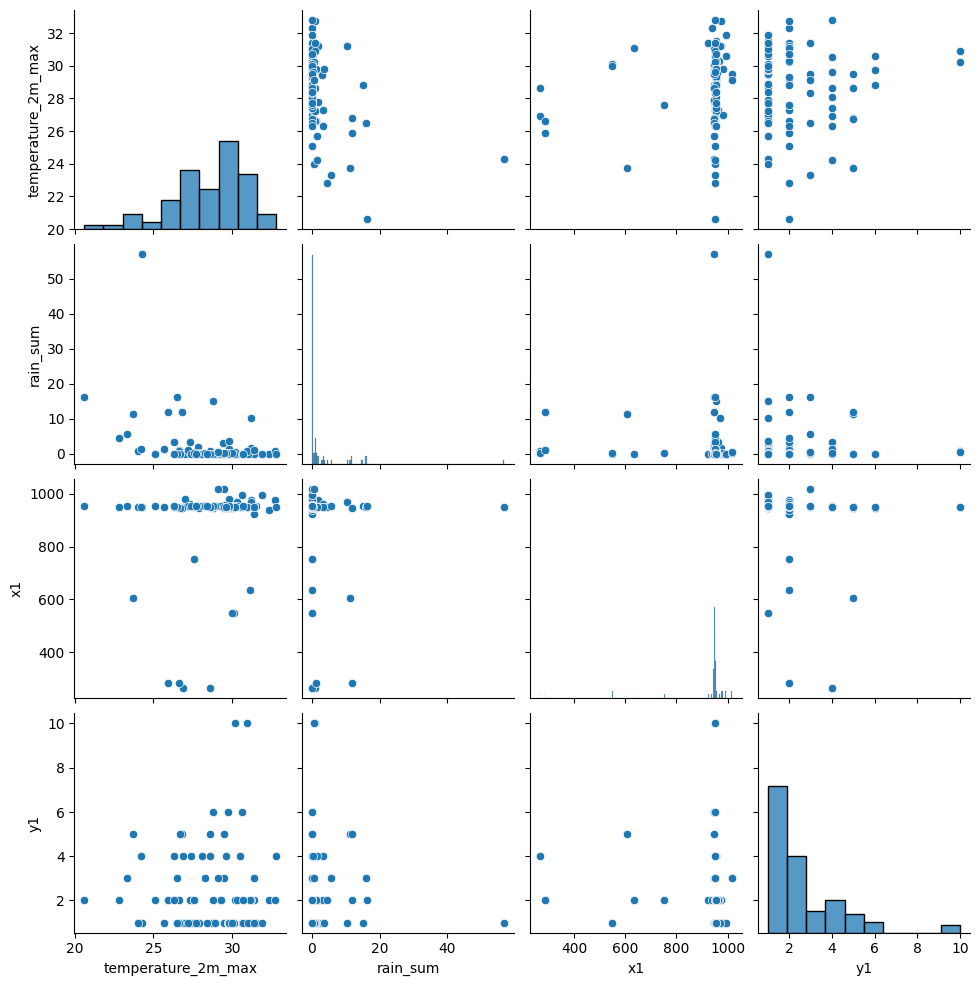

In [10]:
# Example: Pair plot for weather vs bounding box coordinates
sns.pairplot(df[['temperature_2m_max', 'rain_sum', 'x1', 'y1']])
plt.show()

C:\Users\Kennedy\AppData\Local\Temp\ipykernel_20704\3346585797.py:33: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore')


                             Blue Area Percentage
temperature_2m_max                       0.007701
temperature_2m_min                      -0.050211
temperature_2m_mean                     -0.003500
precipitation_sum                        0.023746
rain_sum                                 0.023746
wind_speed_10m_max                      -0.112092
wind_gusts_10m_max                      -0.125914
wind_direction_10m_dominant              0.014984
shortwave_radiation_sum                  0.096002
surface_pressure_min                     0.196986
surface_pressure_max                     0.263729
relative_humidity_2m_min                -0.071318
relative_humidity_2m_max                -0.096261
Blue Area Percentage                     1.000000
Total Bounding Boxes                          NaN
Avg Bounding Box Size                         NaN


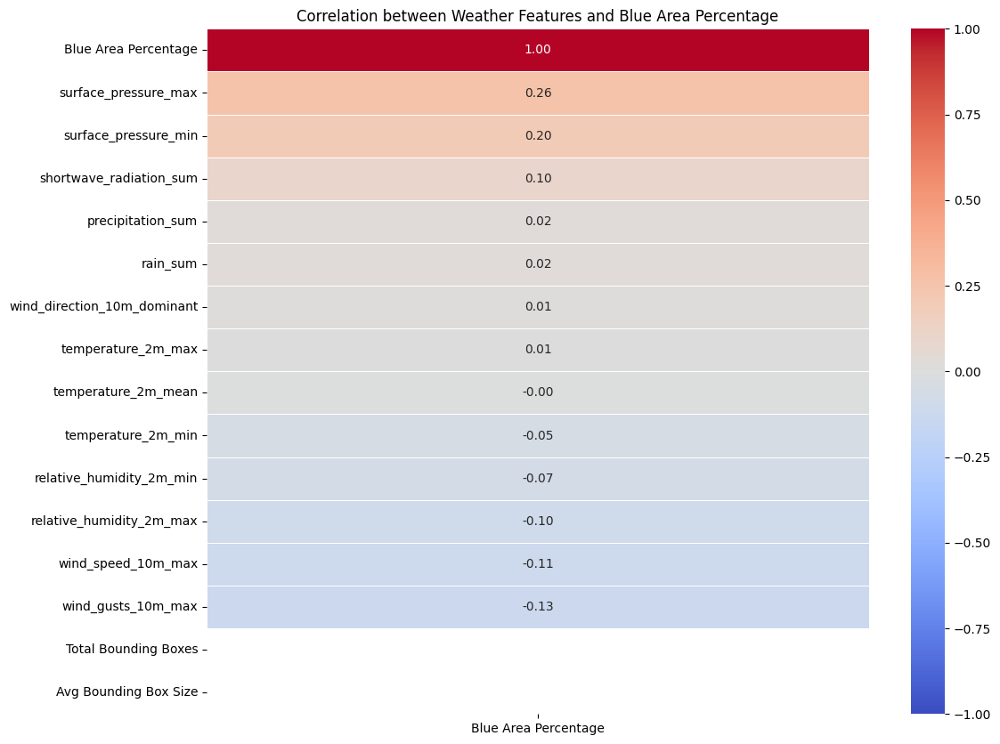

In [8]:
import pandas as pd
import ast
import seaborn as sns
import matplotlib.pyplot as plt

# Load the merged DataFrame
df = pd.read_csv('Merged_Dam_Weather_Data.csv')

# Convert Blue Area Percentage from string to float
df['Blue Area Percentage'] = df['Blue Area Percentage'].str.replace('%', '').astype(float)

# Function to extract features from bounding boxes
def extract_bounding_box_features(bounding_boxes_str):
    try:
        bounding_boxes = ast.literal_eval(bounding_boxes_str)  # Convert string to list of bounding boxes
        total_boxes = len(bounding_boxes)
        avg_size = sum(w * h for _, _, w, h in bounding_boxes) / total_boxes if total_boxes > 0 else 0
        return total_boxes, avg_size
    except Exception as e:
        return 0, 0  # Handle invalid data gracefully

# Apply the function and create new columns
df['Total Bounding Boxes'], df['Avg Bounding Box Size'] = zip(*df['Blue Region Bounding Boxes'].apply(extract_bounding_box_features))

# Drop the original bounding box column if needed
df.drop(columns=['Blue Region Bounding Boxes'], inplace=True)

# Convert 'Date' column to datetime and then drop it for correlation analysis
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df.drop(columns=['Date'], inplace=True)

# Ensure all columns are numeric for correlation calculation
df = df.apply(pd.to_numeric, errors='ignore')

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Print correlation values between weather features and Blue Area Percentage
print(correlation_matrix[['Blue Area Percentage']])

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw a heatmap of the correlation matrix
sns.heatmap(correlation_matrix[['Blue Area Percentage']].sort_values(by='Blue Area Percentage', ascending=False), 
            annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, vmin=-1, vmax=1)

# Title and labels
plt.title('Correlation between Weather Features and Blue Area Percentage')
plt.show()


Now we have the needed data:L Lets create the model

In [2]:
import pandas as pd
import ast
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

'temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean', 
                   'precipitation_sum', 'rain_sum', 'wind_speed_10m_max', 'wind_gusts_10m_max', 'wind_direction_10m_dominant',
                   'shortwave_radiation_sum', 'surface_pressure_min', 'surface_pressure_max', 
                   'relative_humidity_2m_min', 'relative_humidity_2m_max'

Implementing different models

Testing the features: 
Now we need test themodel by traning the model to seperate the different regions in the model and make it so when it gets the weather info it is able to output an image of where the water hyacinths will be on the dam

In [1]:
import cv2
import numpy as np
import pandas as pd
import os
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import ast
import joblib

# Load the dataset
df = pd.read_csv('Merged_Dam_Weather_Data.csv')

# Function to parse bounding boxes from the string
def parse_bounding_boxes(region_str):
    if pd.isna(region_str) or region_str.strip() == '':
        return [], [], [], []  # Return empty lists if no bounding boxes
    try:
        # Parse bounding boxes and convert to lists of coordinates
        boxes = [ast.literal_eval(box.strip()) for box in region_str.split(';') if box.strip()]
        xs, ys, ws, hs = zip(*boxes) if boxes else ([], [], [], [])
        return list(xs), list(ys), list(ws), list(hs)
    except Exception as e:
        print(f"Error parsing bounding boxes: {e}")
        return [], [], [], []

# Extract features and targets
df[['x_list', 'y_list', 'w_list', 'h_list']] = df['Blue Region Bounding Boxes'].apply(lambda x: pd.Series(parse_bounding_boxes(x)))

# Compute 'Avg Bounding Box Size'
df['Avg Bounding Box Size'] = df.apply(lambda row: sum(w * h for w, h in zip(row['w_list'], row['h_list'])) / len(row['w_list']) if len(row['w_list']) > 0 else 0, axis=1)

# Define the function to flatten bounding boxes
def flatten_bounding_boxes(row, max_boxes):
    """
    Convert the list of bounding boxes (x, y, w, h) into a flat list of values.
    If there are fewer bounding boxes than max_boxes, pad with zeros.
    """
    flattened_boxes = []
    for i in range(max_boxes):
        if i < len(row['x_list']):
            flattened_boxes.extend([row['x_list'][i], row['y_list'][i], row['w_list'][i], row['h_list'][i]])
        else:
            # Append zeros if no more bounding boxes exist
            flattened_boxes.extend([0, 0, 0, 0])
    return flattened_boxes

# Determine the maximum number of bounding boxes in the dataset
max_boxes = max(df['x_list'].apply(len))

# Create new columns for the flattened bounding boxes
df['flattened_bounding_boxes'] = df.apply(lambda row: flatten_bounding_boxes(row, max_boxes), axis=1)

# Flatten the list of bounding boxes into separate columns
bounding_boxes_df = pd.DataFrame(df['flattened_bounding_boxes'].tolist(), columns=[f'box_{i}_{dim}' for i in range(max_boxes) for dim in ['x', 'y', 'w', 'h']])

# Combine weather data with bounding box data
df_flat = pd.concat([df[['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean', 
                         'precipitation_sum', 'rain_sum', 'wind_speed_10m_max', 
                         'wind_gusts_10m_max', 'wind_direction_10m_dominant', 
                         'shortwave_radiation_sum', 'surface_pressure_min', 
                         'surface_pressure_max', 'relative_humidity_2m_min', 
                         'relative_humidity_2m_max']], bounding_boxes_df], axis=1)

# Prepare input features (weather data) and targets (bounding boxes)
weather_columns = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean', 
                   'precipitation_sum', 'rain_sum', 'wind_speed_10m_max', 
                   'wind_gusts_10m_max', 'wind_direction_10m_dominant', 
                   'shortwave_radiation_sum', 'surface_pressure_min', 
                   'surface_pressure_max', 'relative_humidity_2m_min', 
                   'relative_humidity_2m_max']

X = df_flat[weather_columns]
y = df_flat.drop(columns=weather_columns)

# Handle missing values
X = X.fillna(0)
y = y.fillna(0)

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# Save the model
joblib.dump(model, 'bounding_box_model.pkl')
print("Model saved as 'bounding_box_model.pkl'.")

# Function to make predictions given weather data
def predict_bounding_boxes(weather_data, num_boxes):
    # Predict the flattened bounding boxes
    prediction = model.predict([weather_data])[0]
    
    # Extract the bounding boxes from the flattened prediction
    bounding_boxes = []
    for i in range(num_boxes):
        start_index = i * 4
        end_index = start_index + 4
        if end_index <= len(prediction):
            box = prediction[start_index:end_index]
            bounding_boxes.append(tuple(map(int, box)))
        else:
            bounding_boxes.append((0, 0, 0, 0))  # Default value if prediction length is shorter

    return bounding_boxes

# Function to draw bounding boxes on an image
def draw_bounding_boxes(image, bounding_boxes):
    image_with_boxes = image.copy()
    for (x, y, w, h) in bounding_boxes:
        cv2.rectangle(image_with_boxes, (int(x), int(y)), (int(x + w), int(y + h)), (0, 255, 0), 2)
    return image_with_boxes

# Function to process input weather data and generate bounding box image
def process_and_visualize(weather_data, reference_image_path, output_folder, date):
    # Determine number of bounding boxes from the dataset
    num_boxes = max_boxes
    
    # Predict bounding boxes using the model
    predicted_boxes = predict_bounding_boxes(weather_data, num_boxes)
    
    # Display the bounding box data and number of regions
    print(f"Number of Predicted Bounding Boxes: {num_boxes}")
    print(f"Predicted Bounding Box Data (x, y, w, h): {predicted_boxes}")

    # Load the reference image
    reference_image = cv2.imread(reference_image_path)
    if reference_image is None:
        print(f"Error: Reference image not found or unable to load at path {reference_image_path}")
        return

    # Draw bounding boxes on the reference image
    image_with_boxes = draw_bounding_boxes(reference_image, predicted_boxes)

    # Ensure the output folder exists
    os.makedirs(output_folder, exist_ok=True)

    # Save the image
    output_image_path = os.path.join(output_folder, f"{date}_bounding_boxes.png")
    cv2.imwrite(output_image_path, image_with_boxes)
    print(f"Saved image with predicted bounding boxes: {output_image_path}")


Mean Squared Error: 13803.307547006929
Model saved as 'bounding_box_model.pkl'.


In [2]:


# Model Input
weather_data = [31.4, 18.5, 24.5, 5.0, 1.0, 8.7, 22.7, 326, 28.94, 887.5, 892.4, 37, 95]  # Replace with actual weather data
image_path = 'Reference image\image_2020-05-29.jpg'
output_folder = 'Output'
date = '2023-03-29'

process_and_visualize(weather_data, image_path, output_folder, date)


C:\Users\Kennedy\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Number of Predicted Bounding Boxes: 1587
Predicted Bounding Box Data (x, y, w, h): [(925, 618, 2, 4), (918, 612, 2, 2), (918, 608, 2, 3), (916, 589, 3, 6), (927, 576, 1, 2), (924, 572, 2, 2), (917, 567, 5, 4), (923, 563, 4, 5), (929, 558, 2, 1), (931, 554, 7, 6), (932, 548, 7, 6), (918, 543, 4, 4), (933, 538, 8, 7), (922, 536, 2, 2), (936, 532, 3, 2), (938, 530, 4, 4), (938, 527, 2, 3), (940, 523, 6, 5), (843, 520, 1, 2), (815, 518, 4, 5), (793, 516, 1, 1), (900, 513, 13, 15), (889, 510, 3, 3), (780, 509, 2, 2), (781, 507, 2, 2), (896, 504, 4, 6), (789, 502, 2, 3), (889, 500, 1, 1), (794, 499, 2, 2), (839, 498, 3, 3), (738, 497, 5, 3), (815, 495, 10, 8), (847, 493, 1, 1), (856, 491, 2, 2), (736, 488, 3, 2), (818, 484, 3, 4), (664, 479, 2, 2), (695, 478, 2, 2), (708, 477, 3, 3), (628, 475, 5, 4), (667, 473, 2, 1), (679, 471, 1, 3), (645, 470, 3, 4), (657, 468, 5, 5), (676, 465, 6, 6), (646, 465, 4, 3), (693, 463, 7, 5), (668, 460, 2, 2), (680, 458, 4, 3), (721, 456, 11, 10), (692, 455, 